Imports & Configuration

In [1]:
from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

print("=" * 70)
print("NOTEBOOK 4")
print("Statistical Analysis & Feature Selection of IQA Features")
print("=" * 70)

print("✓ Libraries imported successfully.")

NOTEBOOK 4
Statistical Analysis & Feature Selection of IQA Features
✓ Libraries imported successfully.


In [2]:
import sys

print("Python executable:")
print(sys.executable)

print("\nPython version:")
print(sys.version)

Python executable:
D:\Software Apps\Python\python.exe

Python version:
3.10.11 (tags/v3.10.11:7d4cc5a, Apr  5 2023, 00:38:17) [MSC v.1929 64 bit (AMD64)]


In [3]:
%pip install seaborn

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.0.1 -> 26.2.1
[notice] To update, run: D:\Software Apps\Python\python.exe -m pip install --upgrade pip


Project Paths

In [4]:
from pathlib import Path

PROJECT_ROOT = Path.cwd().parent
FIGURES_PATH = PROJECT_ROOT / "figures"
IQA_FILE = FIGURES_PATH / "iqa_features_all.csv"

print("=" * 60)
print("Path Configuration")
print("=" * 60)

print(f"Project Root : {PROJECT_ROOT}")
print(f"Figures Path : {FIGURES_PATH}")
print(f"IQA Dataset  : {IQA_FILE}")

if IQA_FILE.exists():
    print("\n✓ IQA feature dataset found.")
else:
    print("\n✗ IQA feature dataset NOT FOUND.")

Path Configuration
Project Root : E:\ML_Project
Figures Path : E:\ML_Project\figures
IQA Dataset  : E:\ML_Project\figures\iqa_features_all.csv

✓ IQA feature dataset found.


Load the dataset perfectly.

In [5]:
iqa_df = pd.read_csv(IQA_FILE)

print("=" * 60)
print("IQA Dataset Loaded")
print("=" * 60)
print(f"Rows    : {len(iqa_df):,}")
print(f"Columns : {len(iqa_df.columns)}")
print("\nColumn Names")

for i, column in enumerate(iqa_df.columns, start=1):
    print(f"{i:2d}. {column}")

IQA Dataset Loaded
Rows    : 100,000
Columns : 16

Column Names
 1. image_name
 2. image_path
 3. split
 4. mean_brightness
 5. brightness_std
 6. rms_contrast
 7. laplacian_variance
 8. tenengrad
 9. entropy
10. dark_pixel_ratio
11. bright_pixel_ratio
12. mean_saturation
13. saturation_std
14. colorfulness
15. edge_density
16. noise_proxy


Define IQA Feature

In [6]:
IQA_FEATURES = [
    "mean_brightness",
    "brightness_std",
    "rms_contrast",
    "laplacian_variance",
    "tenengrad",
    "entropy",
    "dark_pixel_ratio",
    "bright_pixel_ratio",
    "mean_saturation",
    "saturation_std",
    "colorfulness",
    "edge_density",
    "noise_proxy"
]

print("=" * 60)
print("IQA Feature Definition")
print("=" * 60)

print(f"Number of IQA Features : {len(IQA_FEATURES)}")

for i, feature in enumerate(IQA_FEATURES, start=1):
    print(f"{i:2d}. {feature}")

IQA Feature Definition
Number of IQA Features : 13
 1. mean_brightness
 2. brightness_std
 3. rms_contrast
 4. laplacian_variance
 5. tenengrad
 6. entropy
 7. dark_pixel_ratio
 8. bright_pixel_ratio
 9. mean_saturation
10. saturation_std
11. colorfulness
12. edge_density
13. noise_proxy


Dataset Integrity Check

In [7]:
expected_splits = {
    "train": 70_000,
    "valid": 10_000,
    "test": 20_000
}

actual_splits = iqa_df["split"].value_counts()

print("=" * 60)
print("Official Dataset Split Verification")
print("=" * 60)

for split_name, expected_count in expected_splits.items():

    actual_count = actual_splits.get(split_name, 0)

    print(
        f"{split_name:<10} "
        f"Expected: {expected_count:>7,} | "
        f"Actual: {actual_count:>7,}"
    )

print()

if all(
    actual_splits.get(split_name, 0) == expected_count
    for split_name, expected_count in expected_splits.items()
):
    print("✓ Official Train / Validation / Test split verified.")
else:
    print("✗ Dataset split verification failed.")

Official Dataset Split Verification
train      Expected:  70,000 | Actual:  70,000
valid      Expected:  10,000 | Actual:  10,000
test       Expected:  20,000 | Actual:  20,000

✓ Official Train / Validation / Test split verified.


Official Split Verification

In [8]:
expected_splits = {
    "train": 70_000,
    "valid": 10_000,
    "test": 20_000
}

actual_splits = iqa_df["split"].value_counts()

print("=" * 60)
print("Official Dataset Split Verification")
print("=" * 60)

for split_name, expected_count in expected_splits.items():

    actual_count = actual_splits.get(split_name, 0)

    print(
        f"{split_name:<10} "
        f"Expected: {expected_count:>7,} | "
        f"Actual: {actual_count:>7,}"
    )

print()

if all(
    actual_splits.get(split_name, 0) == expected_count
    for split_name, expected_count in expected_splits.items()
):
    print("✓ Official Train / Validation / Test split verified.")
else:
    print("✗ Dataset split verification failed.")

Official Dataset Split Verification
train      Expected:  70,000 | Actual:  70,000
valid      Expected:  10,000 | Actual:  10,000
test       Expected:  20,000 | Actual:  20,000

✓ Official Train / Validation / Test split verified.


Descriptive Statistics

In [9]:
from pathlib import Path

PROJECT_ROOT = Path(r"E:\ML_Project")
RESULTS_PATH = PROJECT_ROOT / "results"

RESULTS_PATH.mkdir(exist_ok=True)

final_iqa_file = RESULTS_PATH / "iqa_features_all.csv"

iqa_df.to_csv(
    final_iqa_file,
    index=False
)

print("=" * 60)
print("Final IQA Dataset")
print("=" * 60)

print(f"Images  : {len(iqa_df):,}")
print(f"Columns : {len(iqa_df.columns):,}")

print()
print(f"Saved to:\n{final_iqa_file}")

print()
print("✓ Final IQA feature dataset saved successfully.")

Final IQA Dataset
Images  : 100,000
Columns : 16

Saved to:
E:\ML_Project\results\iqa_features_all.csv

✓ Final IQA feature dataset saved successfully.


Save Descriptive Statistics

Feature Distribution Analysis

IQA Feature Distribution Analysis


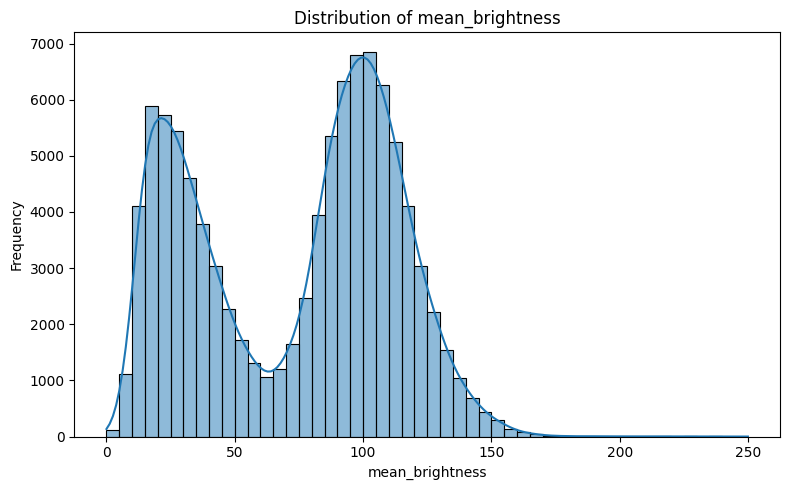

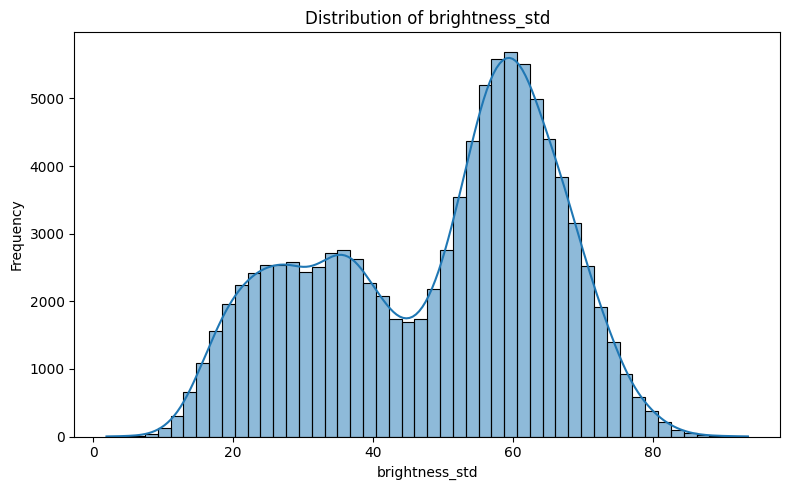

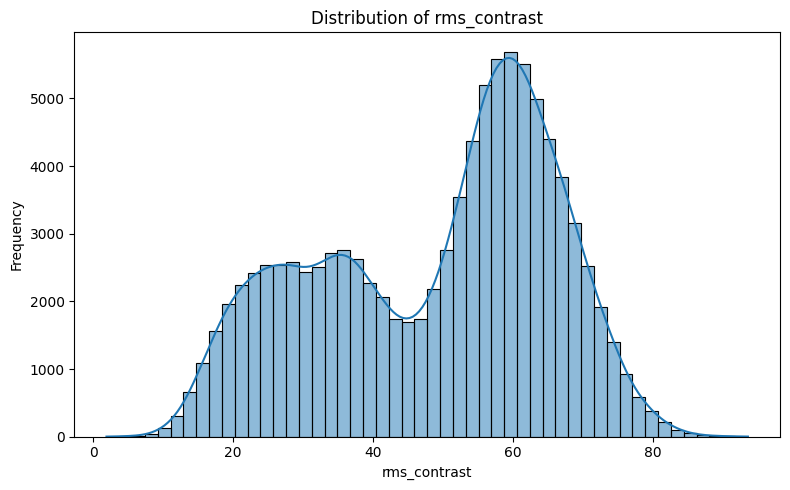

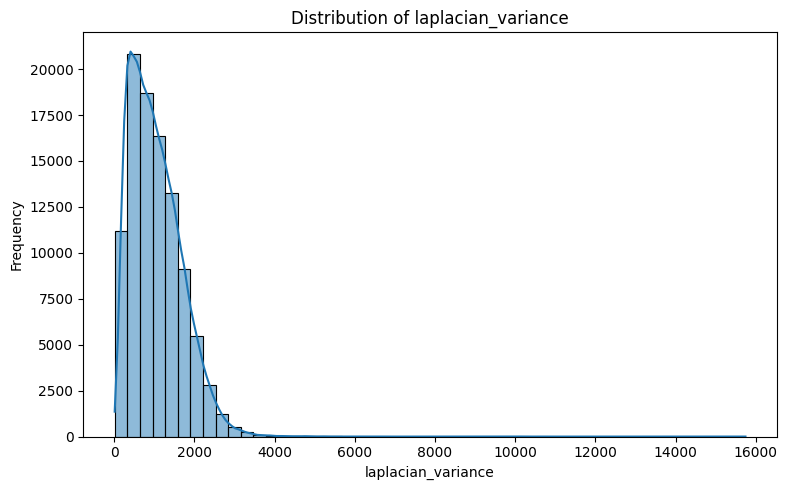

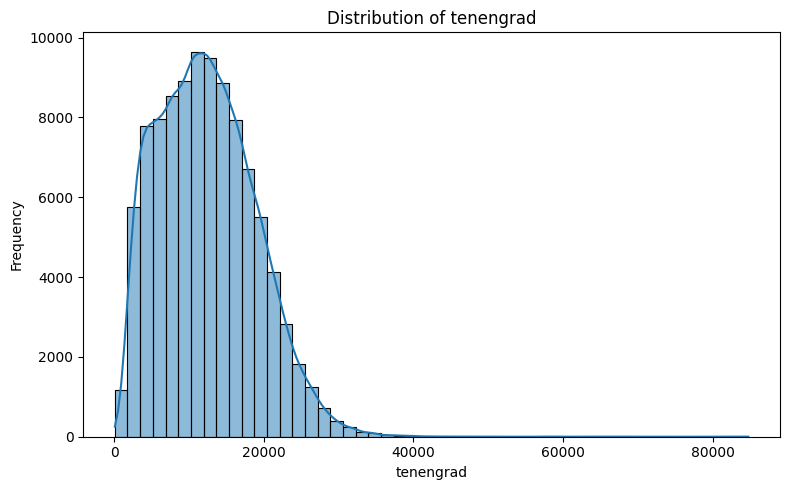

...

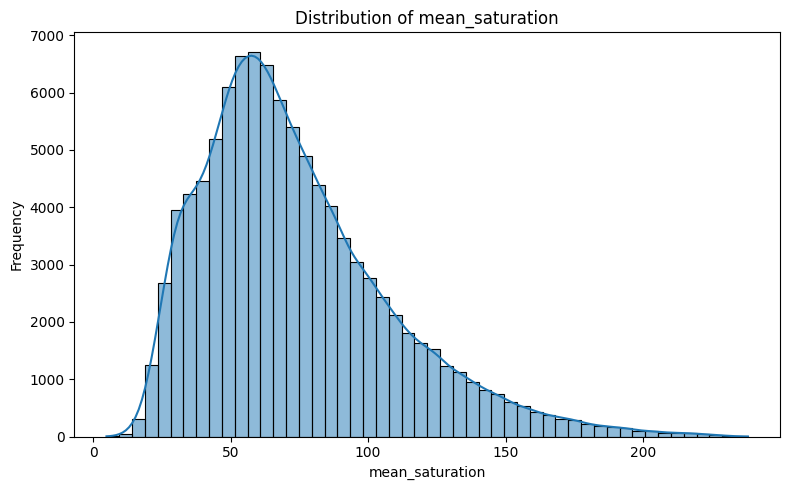

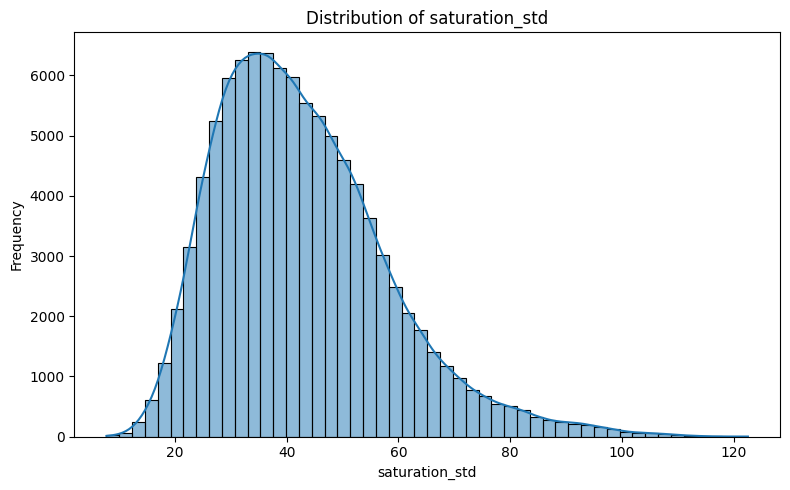

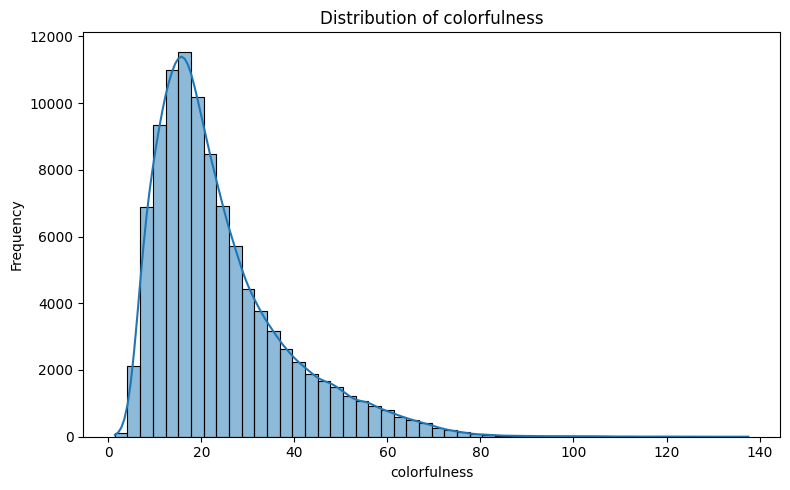

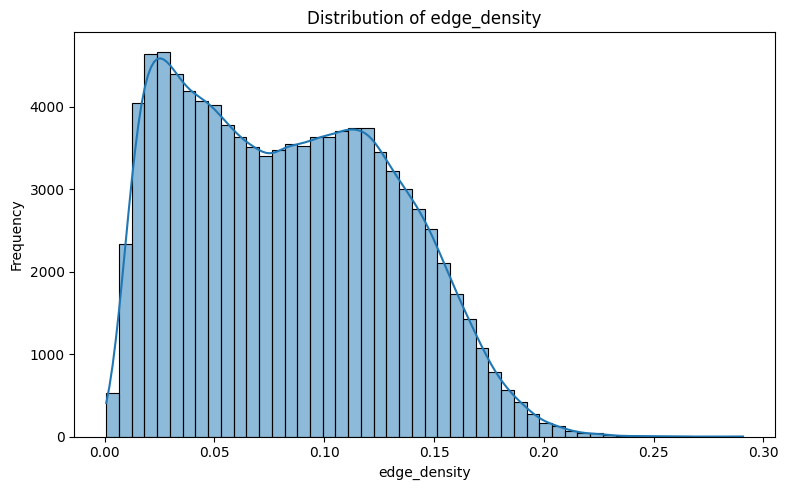

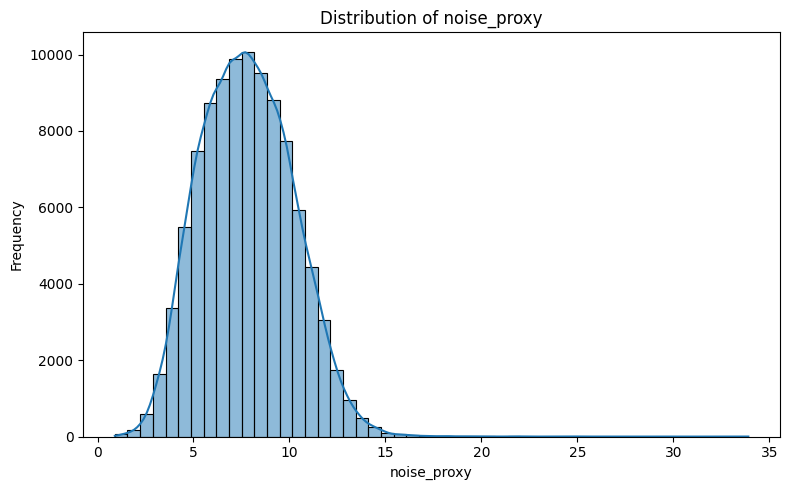

In [10]:
# ==========================================================
# IQA Feature Distribution Analysis
# ==========================================================

print("=" * 70)
print("IQA Feature Distribution Analysis")
print("=" * 70)

for feature in IQA_FEATURES:

    plt.figure(figsize=(8, 5))

    sns.histplot(
        data=iqa_df,
        x=feature,
        bins=50,
        kde=True
    )

    plt.title(f"Distribution of {feature}")
    plt.xlabel(feature)
    plt.ylabel("Frequency")
    plt.tight_layout()
    plt.show()

Boxplot / Outlier Visualization

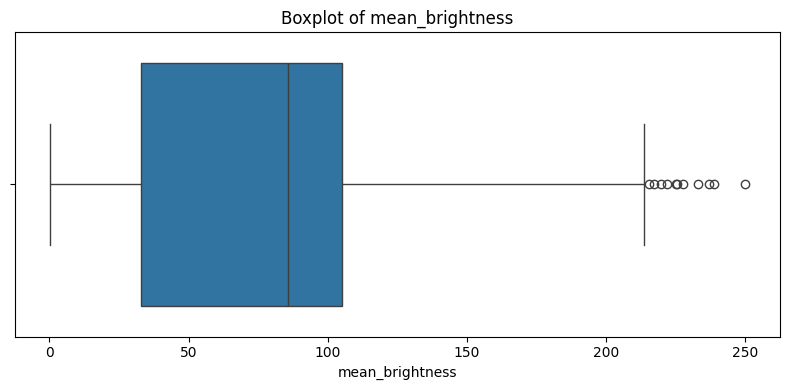

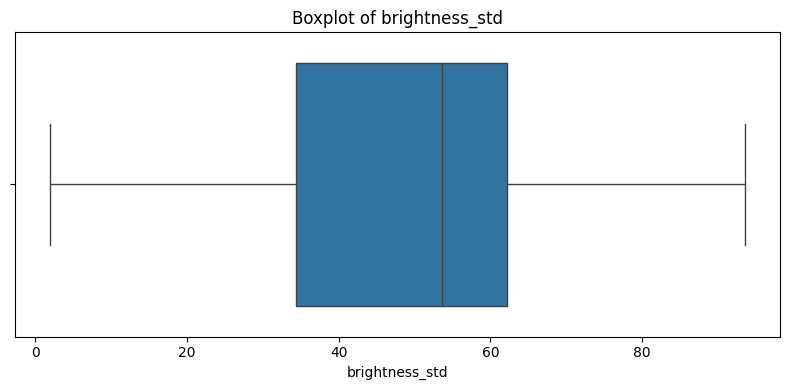

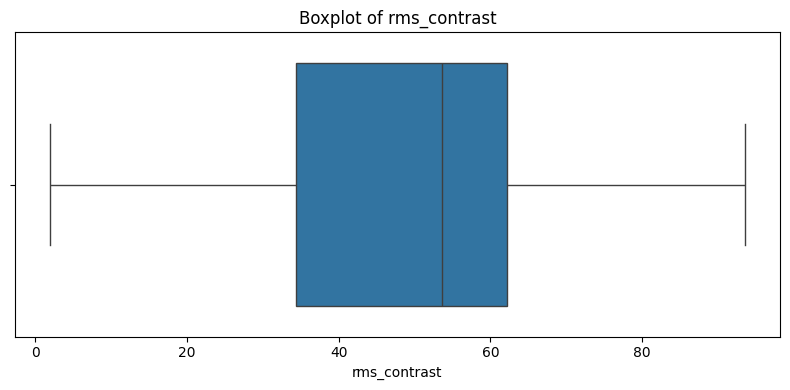

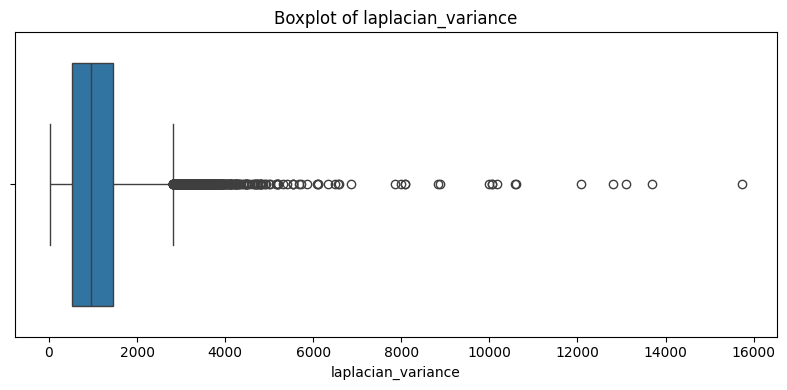

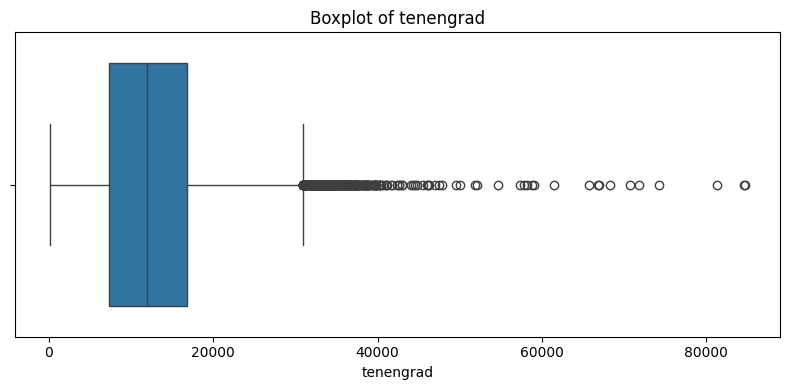

...

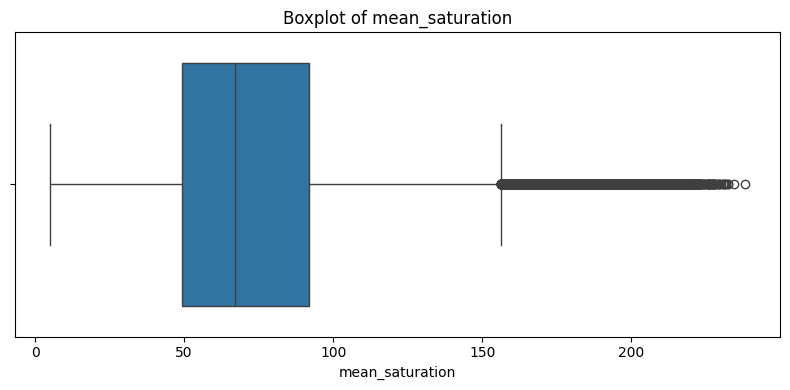

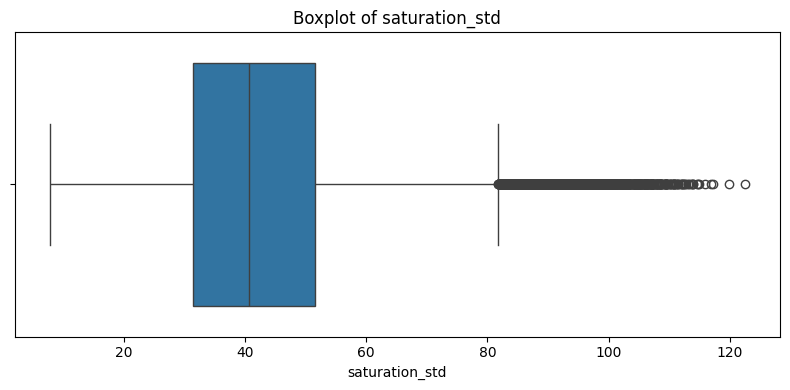

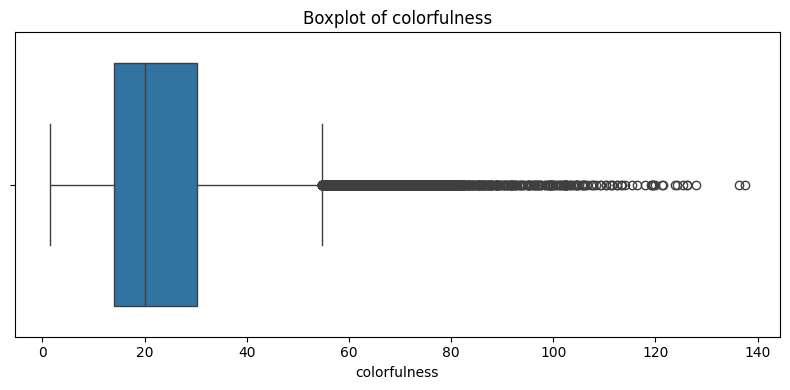

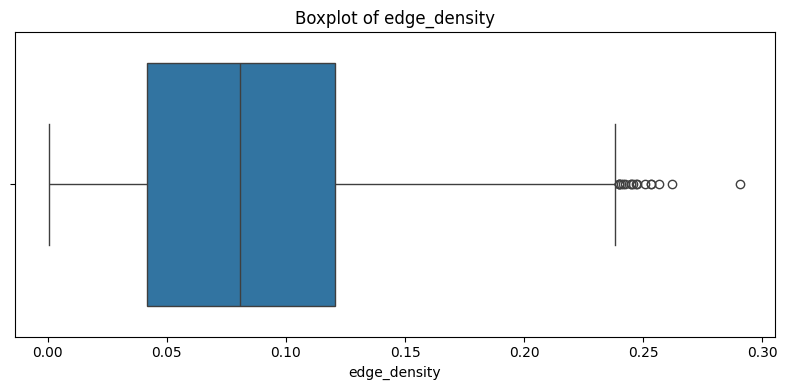

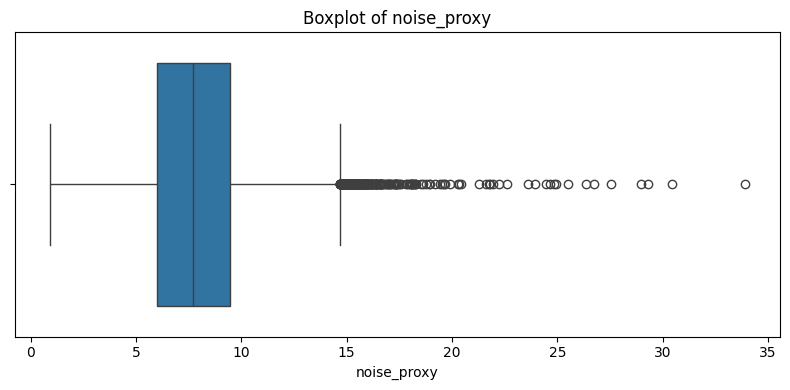

In [28]:
for feature in IQA_FEATURES:

    plt.figure(figsize=(8, 4))

    sns.boxplot(
        x=iqa_df[feature]
    )

    plt.title(f"Boxplot of {feature}")
    plt.xlabel(feature)

    plt.tight_layout()
    plt.show()

Correlation Matrix

IQA Feature Correlation Matrix


,mean_brightness,brightness_std,rms_contrast,laplacian_variance,tenengrad,entropy,dark_pixel_ratio,bright_pixel_ratio,mean_saturation,saturation_std,colorfulness,edge_density,noise_proxy
mean_brightness,1.000,0.850,0.850,0.571,0.626,0.899,-0.964,0.654,-0.538,-0.610,0.437,0.732,0.540
brightness_std,0.850,1.000,1.000,0.574,0.642,0.871,-0.828,0.725,-0.498,-0.572,0.323,0.685,0.552
rms_contrast,0.850,1.000,1.000,0.574,0.642,0.871,-0.828,0.725,-0.498,-0.572,0.323,0.685,0.552
laplacian_variance,0.571,0.574,0.574,1.000,0.924,0.640,-0.600,0.281,-0.321,-0.298,0.344,0.889,0.962
tenengrad,0.626,0.642,0.642,0.924,1.000,0.706,-0.648,0.326,-0.367,-0.341,0.352,0.902,0.901
entropy,0.899,0.871,0.871,0.640,0.706,1.000,-0.928,0.508,-0.515,-0.655,0.464,0.792,0.635
dark_pixel_ratio,-0.964,-0.828,-0.828,-0.600,-0.648,-0.928,1.000,-0.571,0.559,0.633,-0.431,-0.776,-0.574
bright_pixel_ratio,0.654,0.725,0.725,0.281,0.326,0.508,-0.571,1.000,-0.482,-0.485,-0.058,0.354,0.248
mean_saturation,-0.538,-0.498,-0.498,-0.321,-0.367,-0.515,0.559,-0.482,1.000,0.690,0.254,-0.437,-0.304
saturation_std,-0.610,-0.572,-0.572,-0.298,-0.341,-0.655,0.633,-0.485,0.690,1.000,0.090,-0.414,-0.297


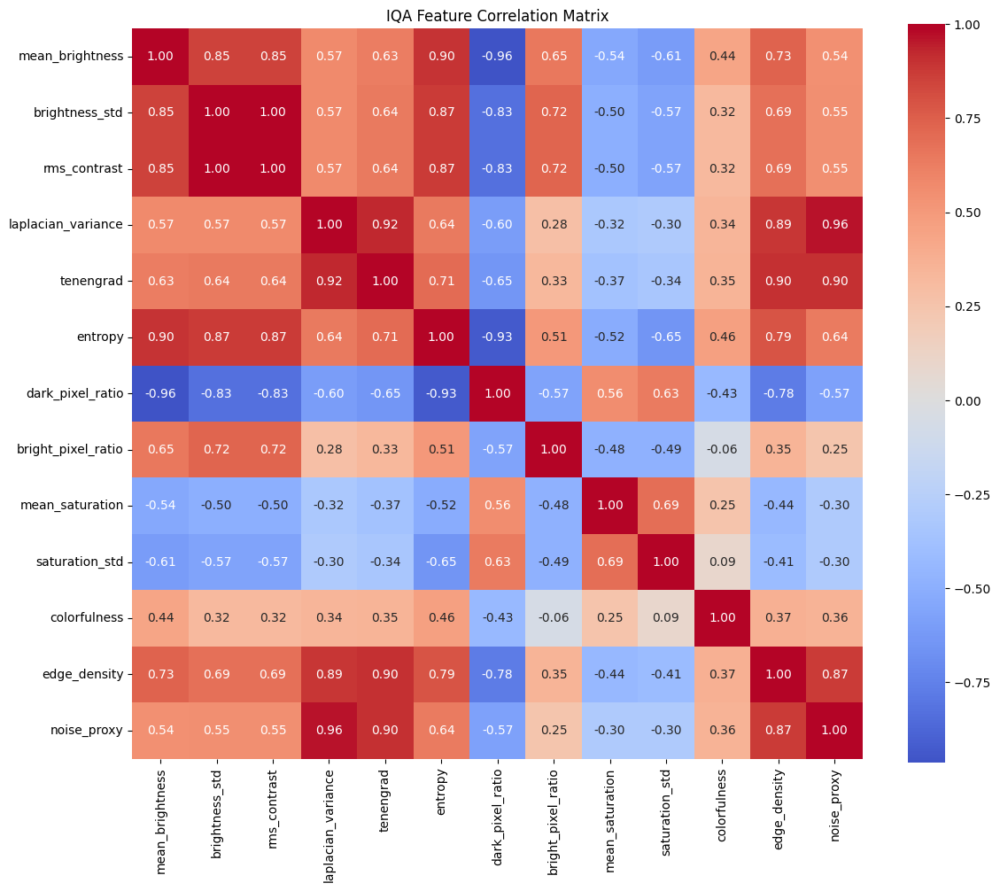

In [11]:
correlation_matrix = (
    iqa_df[IQA_FEATURES]
    .corr(method="pearson")
)

print("=" * 70)
print("IQA Feature Correlation Matrix")
print("=" * 70)

display(
    correlation_matrix.round(3)
)

plt.figure(figsize=(12, 10))

sns.heatmap(
    correlation_matrix,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    center=0,
    square=True
)

plt.title("IQA Feature Correlation Matrix")
plt.tight_layout()
plt.show()

Highly Correlated Feature Pairs

In [12]:
correlation_threshold = 0.90

correlation_pairs = []

for i in range(len(IQA_FEATURES)):

    for j in range(i + 1, len(IQA_FEATURES)):

        feature_1 = IQA_FEATURES[i]
        feature_2 = IQA_FEATURES[j]

        correlation = correlation_matrix.loc[
            feature_1,
            feature_2
        ]

        if abs(correlation) >= correlation_threshold:

            correlation_pairs.append(
                {
                    "Feature 1": feature_1,
                    "Feature 2": feature_2,
                    "Correlation": correlation
                }
            )

high_correlation_df = pd.DataFrame(
    correlation_pairs
)

print("=" * 70)
print("Highly Correlated Feature Pairs")
print("=" * 70)

if len(high_correlation_df) > 0:

    display(
        high_correlation_df.sort_values(
            "Correlation",
            key=lambda x: x.abs(),
            ascending=False
        ).round(4)
    )

else:

    print("No feature pairs exceeded the correlation threshold.")

print()
print(f"Correlation Threshold : |r| >= {correlation_threshold}")

Highly Correlated Feature Pairs


,Feature 1,Feature 2,Correlation
1,brightness_std,rms_contrast,1.0000
0,mean_brightness,dark_pixel_ratio,-0.9641
3,laplacian_variance,noise_proxy,0.9617
6,entropy,dark_pixel_ratio,-0.9276
2,laplacian_variance,tenengrad,0.9236
4,tenengrad,edge_density,0.9020
5,tenengrad,noise_proxy,0.9014



Correlation Threshold : |r| >= 0.9


Outlier Analysis Using IQR

In [13]:
outlier_results = []

for feature in IQA_FEATURES:

    Q1 = iqa_df[feature].quantile(0.25)
    Q3 = iqa_df[feature].quantile(0.75)

    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outlier_mask = (
        (iqa_df[feature] < lower_bound) |
        (iqa_df[feature] > upper_bound)
    )

    outlier_count = outlier_mask.sum()

    outlier_percentage = (
        outlier_count / len(iqa_df)
    ) * 100

    outlier_results.append(
        {
            "Feature": feature,
            "Q1": Q1,
            "Q3": Q3,
            "IQR": IQR,
            "Lower Bound": lower_bound,
            "Upper Bound": upper_bound,
            "Outlier Count": outlier_count,
            "Outlier %": outlier_percentage
        }
    )

outlier_df = pd.DataFrame(outlier_results)

print("=" * 80)
print("IQA Feature Outlier Analysis")
print("=" * 80)

display(
    outlier_df.round(4)
)

IQA Feature Outlier Analysis


,Feature,Q1,Q3,IQR,Lower Bound,Upper Bound,Outlier Count,Outlier %
0,mean_brightness,32.8582,105.1946,72.3364,-75.6465,213.6992,11,0.011
1,brightness_std,34.4139,62.2394,27.8256,-7.3245,103.9778,0,0.000
2,rms_contrast,34.4139,62.2394,27.8256,-7.3245,103.9778,0,0.000
3,laplacian_variance,533.4938,1448.2150,914.7212,-838.5880,2820.2968,991,0.991
4,tenengrad,7357.4320,16786.4538,9429.0218,-6786.1008,30929.9865,525,0.525
5,entropy,6.1645,7.5101,1.3455,4.1462,9.5284,813,0.813
6,dark_pixel_ratio,0.1302,0.7392,0.6089,-0.7831,1.6526,0,0.000
7,bright_pixel_ratio,0.0060,0.0686,0.0626,-0.0879,0.1624,3999,3.999
8,mean_saturation,49.1523,91.9727,42.8204,-15.0784,156.2034,2922,2.922
9,saturation_std,31.4659,51.5987,20.1329,1.2666,81.7980,2210,2.210


Train / Validation / Test Statistics

In [14]:
split_statistics = (
    iqa_df
    .groupby("split")[IQA_FEATURES]
    .agg(["mean", "std"])
)

print("=" * 70)
print("Feature Statistics Across Official Dataset Splits")
print("=" * 70)

display(
    split_statistics.round(4)
)

Feature Statistics Across Official Dataset Splits


mean_brightness          brightness_std          rms_contrast           \
                 mean      std           mean      std         mean      std   
split                                                                          
test          73.5728  39.2640        48.8993  17.0057      48.8993  17.0057   
train         73.4795  39.2307        48.9323  16.9599      48.9323  16.9599   
valid         73.9376  39.0906        49.1427  16.9690      49.1427  16.9690   

      laplacian_variance             tenengrad             ...  \
                    mean       std        mean        std  ...   
split                                                      ...   
test           1040.2220  650.6167  12381.2985  6507.8232  ...   
train          1048.6087  653.2411  12449.4958  6478.8235  ...   
valid          1051.9381  638.4620  12489.8151  6427.8992  ...   

      mean_saturation          saturation_std          colorfulness           \
                 mean      std           mean      std         mean      std   
split                                                                          
test          74.2253  35.1384        42.7517  15.4540      24.0986  14.3462   
train         73.8783  34.6652        42.8776  15.4378      24.0074  14.1711   
valid         73.2552  34.4886        42.5440  15.2703      24.0238  14.2660   

      edge_density         noise_proxy          
              mean     std        mean     std  
split                                           
test        0.0828  0.0476      7.7640  2.4101  
train       0.0835  0.0476      7.8000  2.4044  
valid       0.0838  0.0475      7.8248  2.3880  

[3 rows x 26 columns]

Split Mean Difference Analysis

In [15]:
split_means = (
    iqa_df
    .groupby("split")[IQA_FEATURES]
    .mean()
)

print("=" * 70)
print("IQA Feature Means by Dataset Split")
print("=" * 70)

display(
    split_means.round(4)
)

print()
print("Maximum absolute difference between split means:")

for feature in IQA_FEATURES:

    max_difference = (
        split_means[feature].max()
        - split_means[feature].min()
    )

    print(
        f"{feature:<25}: {max_difference:.4f}"
    )

IQA Feature Means by Dataset Split


,mean_brightness,brightness_std,rms_contrast,laplacian_variance,tenengrad,entropy,dark_pixel_ratio,bright_pixel_ratio,mean_saturation,saturation_std,colorfulness,edge_density,noise_proxy
split,,,,,,,,,,,,,
test,73.5728,48.8993,48.8993,1040.2220,12381.2985,6.7991,0.4054,0.0454,74.2253,42.7517,24.0986,0.0828,7.7640
train,73.4795,48.9323,48.9323,1048.6087,12449.4958,6.7990,0.4051,0.0458,73.8783,42.8776,24.0074,0.0835,7.8000
valid,73.9376,49.1427,49.1427,1051.9381,12489.8151,6.8059,0.4012,0.0457,73.2552,42.5440,24.0238,0.0838,7.8248



Maximum absolute difference between split means:
mean_brightness          : 0.4580
brightness_std           : 0.2434
rms_contrast             : 0.2434
laplacian_variance       : 11.7162
tenengrad                : 108.5166
entropy                  : 0.0069
dark_pixel_ratio         : 0.0042
bright_pixel_ratio       : 0.0004
mean_saturation          : 0.9701
saturation_std           : 0.3336
colorfulness             : 0.0912
edge_density             : 0.0010
noise_proxy              : 0.0608


Feature Scale Analysis

In [16]:
scale_analysis = pd.DataFrame(
    {
        "Feature": IQA_FEATURES,
        "Min": [
            iqa_df[f].min()
            for f in IQA_FEATURES
        ],
        "Max": [
            iqa_df[f].max()
            for f in IQA_FEATURES
        ],
        "Mean": [
            iqa_df[f].mean()
            for f in IQA_FEATURES
        ],
        "Std": [
            iqa_df[f].std()
            for f in IQA_FEATURES
        ]
    }
)

scale_analysis["Range"] = (
    scale_analysis["Max"]
    - scale_analysis["Min"]
)

print("=" * 70)
print("IQA Feature Scale Analysis")
print("=" * 70)

display(
    scale_analysis.round(4)
)

IQA Feature Scale Analysis


,Feature,Min,Max,Mean,Std,Range
0,mean_brightness,0.1223,249.9690,73.5440,39.2232,249.8467
1,brightness_std,1.8892,93.5786,48.9467,16.9699,91.6893
2,rms_contrast,1.8892,93.5786,48.9467,16.9699,91.6893
3,laplacian_variance,12.6215,15744.0910,1047.2643,651.2569,15731.4695
4,tenengrad,107.5040,84731.3879,12439.8883,6479.5766,84623.8839
5,entropy,0.2549,7.9290,6.7997,0.9111,7.6741
6,dark_pixel_ratio,0.0000,0.9996,0.4048,0.3190,0.9996
7,bright_pixel_ratio,0.0000,0.9590,0.0457,0.0536,0.9590
8,mean_saturation,4.8788,238.1667,73.8854,34.7434,233.2879
9,saturation_std,7.7362,122.5374,42.8191,15.4246,114.8012


Identify Constant / Near-Constant Features

In [17]:
variance_threshold = 1e-6

feature_variance = (
    iqa_df[IQA_FEATURES]
    .var()
    .sort_values()
)

print("=" * 70)
print("Feature Variance Analysis")
print("=" * 70)

display(
    feature_variance.to_frame("Variance").round(6)
)

near_constant_features = (
    feature_variance[
        feature_variance <= variance_threshold
    ]
    .index
    .tolist()
)

print()

if near_constant_features:

    print("Near-constant features:")
    for feature in near_constant_features:
        print(f"- {feature}")

else:

    print("✓ No near-constant features detected.")

Feature Variance Analysis


,Variance
edge_density,2.267000e-03
bright_pixel_ratio,2.875000e-03
dark_pixel_ratio,1.017680e-01
entropy,8.300750e-01
noise_proxy,5.778983e+00
colorfulness,2.020859e+02
saturation_std,2.379171e+02
brightness_std,2.879788e+02
rms_contrast,2.879788e+02
mean_saturation,1.207101e+03



✓ No near-constant features detected.


Candidate Feature Selection. Actualy, we will try to do not delete any feature automatically because it has high correlation or outliers

In [18]:
candidate_features = IQA_FEATURES.copy()

# Remove near-constant features only
selected_features = [
    feature
    for feature in candidate_features
    if feature not in near_constant_features
]

print("=" * 70)
print("Candidate Feature Selection")
print("=" * 70)

print(f"Original Features : {len(IQA_FEATURES)}")
print(f"Selected Features : {len(selected_features)}")

print()

print("Selected Features:")

for i, feature in enumerate(selected_features, start=1):
    print(f"{i:2d}. {feature}")

print()

print(
    "Note: Highly correlated features are flagged for research "
    "interpretation before removal."
)

Candidate Feature Selection
Original Features : 13
Selected Features : 13

Selected Features:
 1. mean_brightness
 2. brightness_std
 3. rms_contrast
 4. laplacian_variance
 5. tenengrad
 6. entropy
 7. dark_pixel_ratio
 8. bright_pixel_ratio
 9. mean_saturation
10. saturation_std
11. colorfulness
12. edge_density
13. noise_proxy

Note: Highly correlated features are flagged for research interpretation before removal.


Saved Features

In [19]:
selected_features_file = (
    RESULTS_PATH / "selected_iqa_features.csv"
)

selected_features_df = pd.DataFrame(
    {
        "Feature": selected_features
    }
)

selected_features_df.to_csv(
    selected_features_file,
    index=False
)

print("=" * 70)
print("Selected IQA Features Saved")
print("=" * 70)

print(f"Output : {selected_features_file}")
print(f"Features Saved : {len(selected_features):,}")

print("\n✓ Feature list saved successfully.")

Selected IQA Features Saved
Output : E:\ML_Project\results\selected_iqa_features.csv
Features Saved : 13

✓ Feature list saved successfully.


Final Notebook 4 Summary

In [20]:
print("=" * 75)
print("NOTEBOOK 4 — STATISTICAL ANALYSIS SUMMARY")
print("=" * 75)
print(f"Total Images Analyzed      : {len(iqa_df):,}")
print(f"Original IQA Features     : {len(IQA_FEATURES)}")
print(f"Selected IQA Features     : {len(selected_features)}")
print(f"Highly Correlated Pairs   : {len(high_correlation_df)}")
print(f"Near-Constant Features    : {len(near_constant_features)}")
print()
print("Official Dataset Splits")
print("-" * 75)

for split_name, expected_count in expected_splits.items():

    actual_count = actual_splits.get(
        split_name,
        0
    )

    print(
        f"{split_name:<10}: {actual_count:,}"
    )
print()
print("Analysis Completed")
print("-" * 75)
print("✓ Descriptive statistics completed.")
print("✓ Feature distributions analyzed.")
print("✓ Correlation analysis completed.")
print("✓ Redundancy analysis completed.")
print("✓ Outlier analysis completed.")
print("✓ Train/Validation/Test comparison completed.")
print("✓ Feature scale analysis completed.")
print("✓ Feature selection completed.")
print()
print("Overall Status")
print("-" * 75)
print(
    "✓ IQA statistical analysis completed successfully."
)
print(
    "✓ Candidate IQA feature set prepared for downstream research."
)

NOTEBOOK 4 — STATISTICAL ANALYSIS SUMMARY
Total Images Analyzed      : 100,000
Original IQA Features     : 13
Selected IQA Features     : 13
Highly Correlated Pairs   : 7
Near-Constant Features    : 0

Official Dataset Splits
---------------------------------------------------------------------------
train     : 70,000
valid     : 10,000
test      : 20,000

Analysis Completed
---------------------------------------------------------------------------
✓ Descriptive statistics completed.
✓ Feature distributions analyzed.
✓ Correlation analysis completed.
✓ Redundancy analysis completed.
✓ Outlier analysis completed.
✓ Train/Validation/Test comparison completed.
✓ Feature scale analysis completed.
✓ Feature selection completed.

Overall Status
---------------------------------------------------------------------------
✓ IQA statistical analysis completed successfully.
✓ Candidate IQA feature set prepared for downstream research.


Detailed Correlation Report

In [21]:
print("=" * 75)
print("DETAILED CORRELATION ANALYSIS")
print("=" * 75)

# Get all unique feature pairs
correlation_pairs_all = []

for i in range(len(IQA_FEATURES)):

    for j in range(i + 1, len(IQA_FEATURES)):

        feature_1 = IQA_FEATURES[i]
        feature_2 = IQA_FEATURES[j]

        correlation = correlation_matrix.loc[
            feature_1,
            feature_2
        ]

        correlation_pairs_all.append({
            "Feature 1": feature_1,
            "Feature 2": feature_2,
            "Correlation": correlation,
            "Absolute Correlation": abs(correlation)
        })

correlation_pairs_all_df = pd.DataFrame(
    correlation_pairs_all
)

correlation_pairs_all_df = (
    correlation_pairs_all_df
    .sort_values(
        "Absolute Correlation",
        ascending=False
    )
    .reset_index(drop=True)
)

display(
    correlation_pairs_all_df.round(4)
)

DETAILED CORRELATION ANALYSIS


,Feature 1,Feature 2,Correlation,Absolute Correlation
0,brightness_std,rms_contrast,1.0000,1.0000
1,mean_brightness,dark_pixel_ratio,-0.9641,0.9641
2,laplacian_variance,noise_proxy,0.9617,0.9617
3,entropy,dark_pixel_ratio,-0.9276,0.9276
4,laplacian_variance,tenengrad,0.9236,0.9236
...,...,...,...,...
73,laplacian_variance,bright_pixel_ratio,0.2807,0.2807
74,mean_saturation,colorfulness,0.2538,0.2538
75,bright_pixel_ratio,noise_proxy,0.2477,0.2477
76,saturation_std,colorfulness,0.0897,0.0897


Strong Redundancy Report

In [22]:
print("=" * 75)
print("STRONG FEATURE REDUNDANCY")
print("=" * 75)

for threshold in [0.95, 0.90, 0.80, 0.70]:

    count = (
        correlation_pairs_all_df[
            correlation_pairs_all_df["Absolute Correlation"] >= threshold
        ]
        .shape[0]
    )

    print(
        f"|Correlation| >= {threshold:.2f} : "
        f"{count} pair(s)"
    )
print()
strong_pairs = correlation_pairs_all_df[
    correlation_pairs_all_df["Absolute Correlation"] >= 0.90
]

if len(strong_pairs) > 0:

    print("Feature pairs requiring investigation:")
    print()

    for _, row in strong_pairs.iterrows():

        print(
            f"{row['Feature 1']:<25} ↔ "
            f"{row['Feature 2']:<25} "
            f"r = {row['Correlation']:.4f}"
        )
else:
    print("No strong redundancy detected.")

STRONG FEATURE REDUNDANCY
|Correlation| >= 0.95 : 3 pair(s)
|Correlation| >= 0.90 : 7 pair(s)
|Correlation| >= 0.80 : 16 pair(s)
|Correlation| >= 0.70 : 22 pair(s)

Feature pairs requiring investigation:

brightness_std            ↔ rms_contrast              r = 1.0000
mean_brightness           ↔ dark_pixel_ratio          r = -0.9641
laplacian_variance        ↔ noise_proxy               r = 0.9617
entropy                   ↔ dark_pixel_ratio          r = -0.9276
laplacian_variance        ↔ tenengrad                 r = 0.9236
tenengrad                 ↔ edge_density              r = 0.9020
tenengrad                 ↔ noise_proxy               r = 0.9014


Feature Percentile Profile

In [23]:
percentiles = [0.01, 0.05, 0.10, 0.25, 0.50, 0.75, 0.90, 0.95, 0.99]
percentile_table = (
    iqa_df[IQA_FEATURES]
    .quantile(percentiles)
    .T
)
percentile_table.columns = [
    "P01",
    "P05",
    "P10",
    "P25",
    "P50",
    "P75",
    "P90",
    "P95",
    "P99"
]
print("=" * 90)
print("IQA FEATURE PERCENTILE PROFILE")
print("=" * 90)

display(
    percentile_table.round(4)
)

IQA FEATURE PERCENTILE PROFILE


,P01,P05,P10,P25,P50,P75,P90,P95,P99
mean_brightness,9.4387,14.8145,19.0202,32.8582,85.5596,105.1946,119.4590,128.2625,145.4219
brightness_std,14.4288,19.5319,23.5742,34.4139,53.6352,62.2394,68.6124,72.1108,78.1655
rms_contrast,14.4288,19.5319,23.5742,34.4139,53.6352,62.2394,68.6124,72.1108,78.1655
laplacian_variance,123.4111,225.8638,308.7879,533.4938,943.8292,1448.2150,1921.3127,2212.8943,2816.0374
tenengrad,1711.1511,3029.8702,4161.3004,7357.4320,11996.1117,16786.4538,21062.5992,23626.2795,28813.5748
entropy,4.2641,5.0230,5.4007,6.1645,7.2313,7.5101,7.6307,7.6840,7.7638
dark_pixel_ratio,0.0114,0.0447,0.0707,0.1302,0.2557,0.7392,0.8897,0.9313,0.9725
bright_pixel_ratio,0.0002,0.0009,0.0018,0.0060,0.0262,0.0686,0.1159,0.1504,0.2365
mean_saturation,21.8357,29.1626,34.8460,49.1523,67.0306,91.9727,121.9202,141.8341,181.7677
saturation_std,17.0910,22.1183,25.2350,31.4659,40.6327,51.5987,62.9777,71.5060,90.4650


Feature Variability Ranking

In [24]:
variability_table = pd.DataFrame({
    "Feature": IQA_FEATURES,
    "Mean": [
        iqa_df[f].mean()
        for f in IQA_FEATURES
    ],
    "Std": [
        iqa_df[f].std()
        for f in IQA_FEATURES
    ],
    "Coefficient of Variation": [
        (
            iqa_df[f].std() /
            abs(iqa_df[f].mean())
        )
        if iqa_df[f].mean() != 0
        else np.nan
        for f in IQA_FEATURES
    ]
})

variability_table = (
    variability_table
    .sort_values(
        "Coefficient of Variation",
        ascending=False
    )
    .reset_index(drop=True)
)

print("=" * 75)
print("FEATURE VARIABILITY RANKING")
print("=" * 75)

display(
    variability_table.round(4)
)

FEATURE VARIABILITY RANKING


,Feature,Mean,Std,Coefficient of Variation
0,bright_pixel_ratio,0.0457,0.0536,1.1728
1,dark_pixel_ratio,0.4048,0.3190,0.7881
2,laplacian_variance,1047.2643,651.2569,0.6219
3,colorfulness,24.0273,14.2157,0.5916
4,edge_density,0.0834,0.0476,0.5711
5,mean_brightness,73.5440,39.2232,0.5333
6,tenengrad,12439.8883,6479.5766,0.5209
7,mean_saturation,73.8854,34.7434,0.4702
8,saturation_std,42.8191,15.4246,0.3602
9,brightness_std,48.9467,16.9699,0.3467


Split Distribution Comparison

TRAIN / VALIDATION / TEST FEATURE DISTRIBUTION


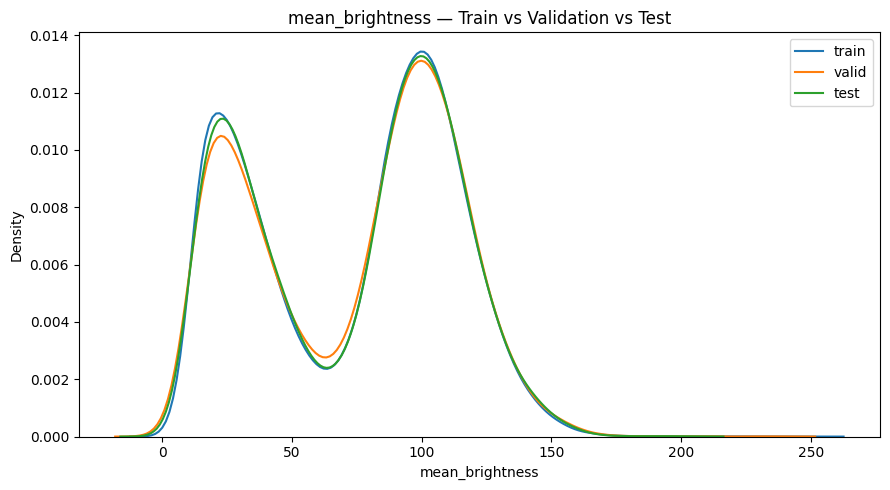

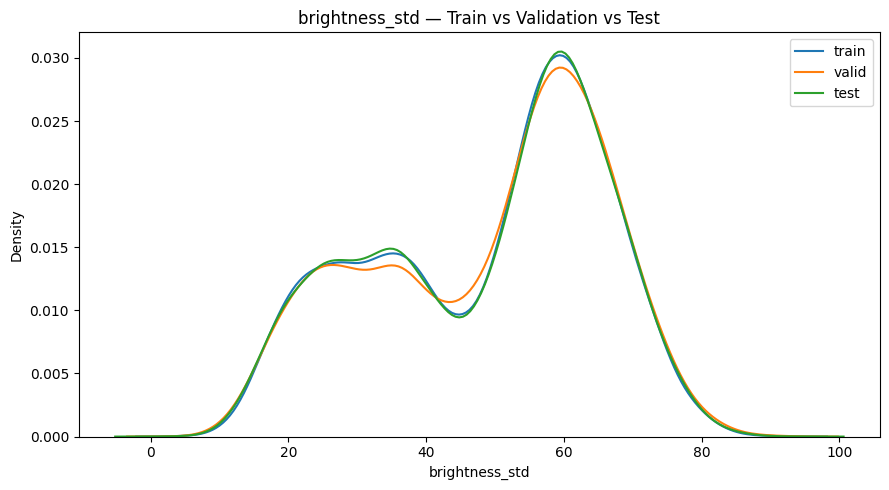

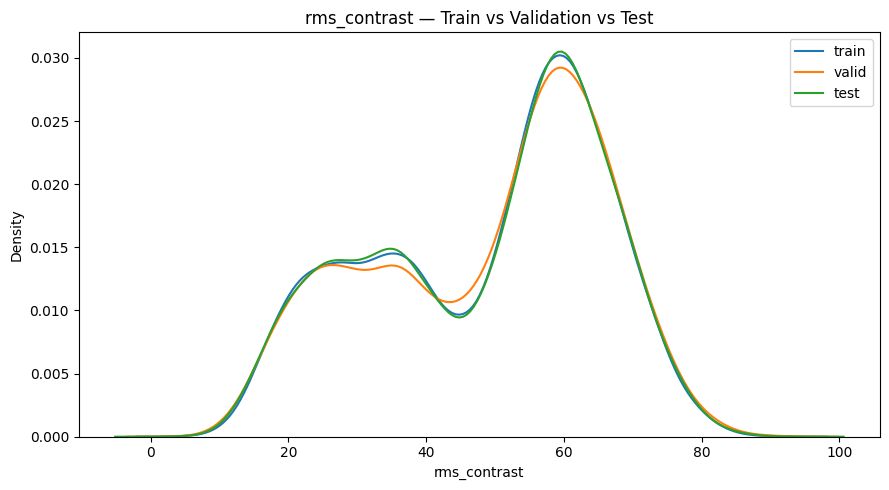

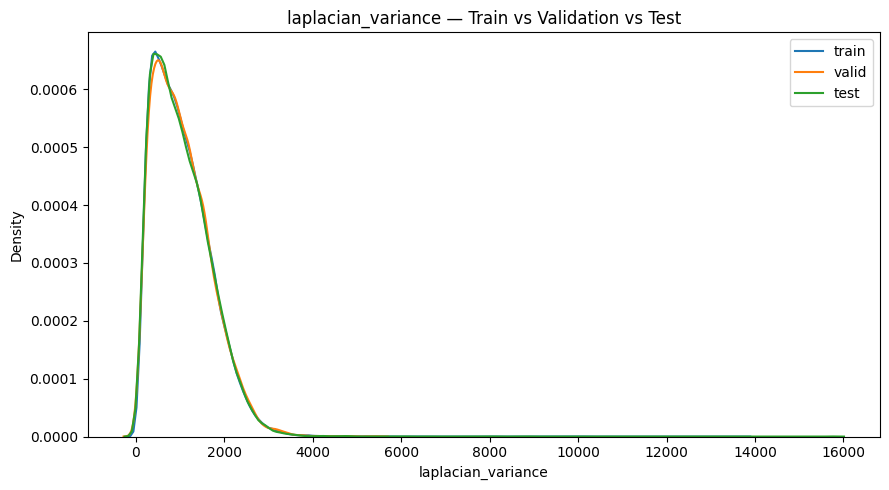

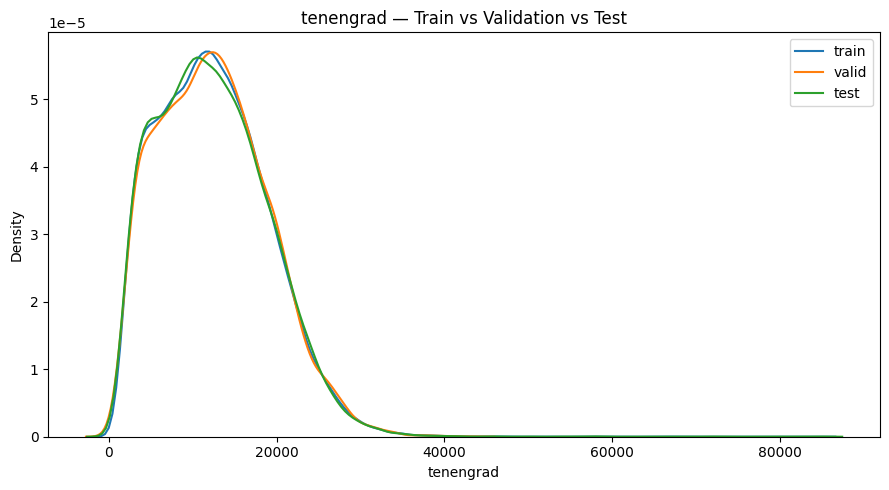

...

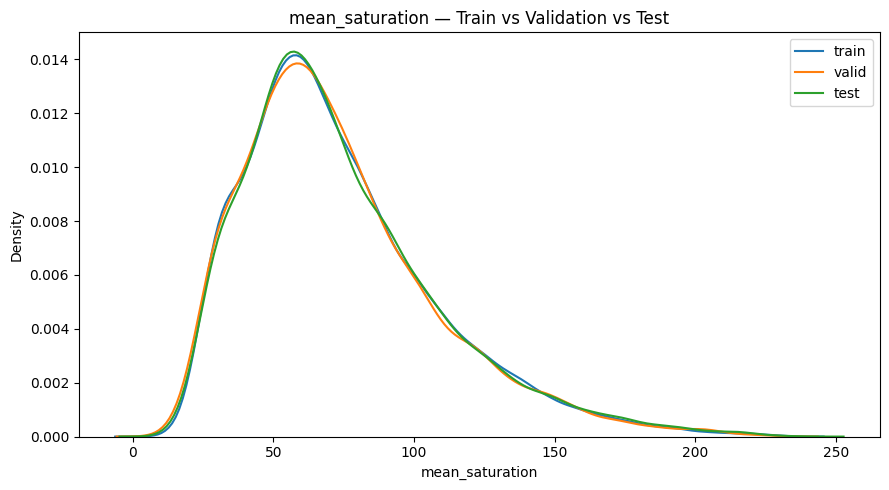

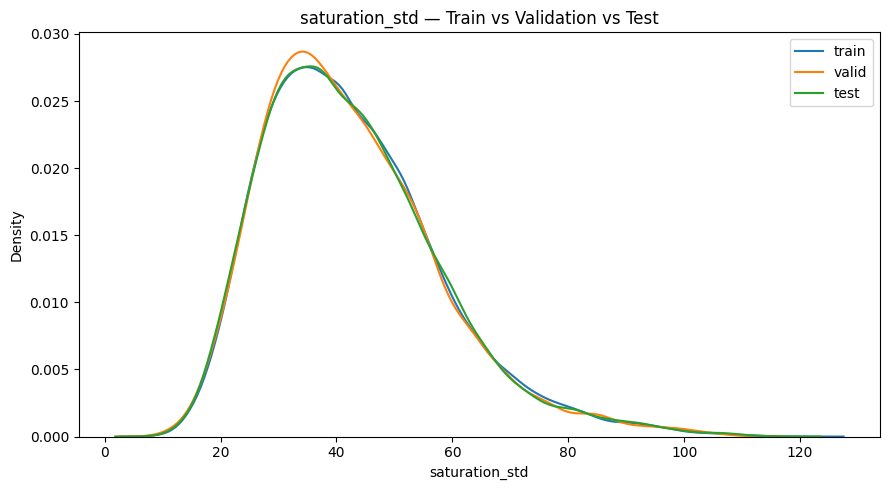

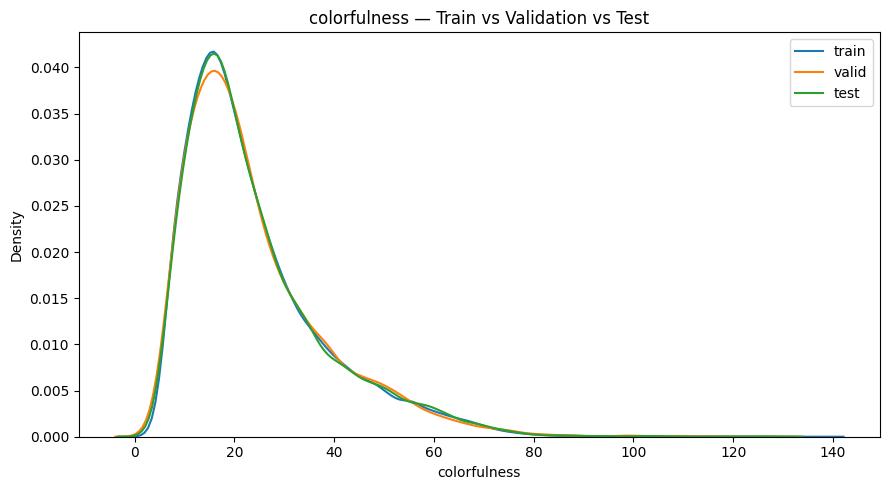

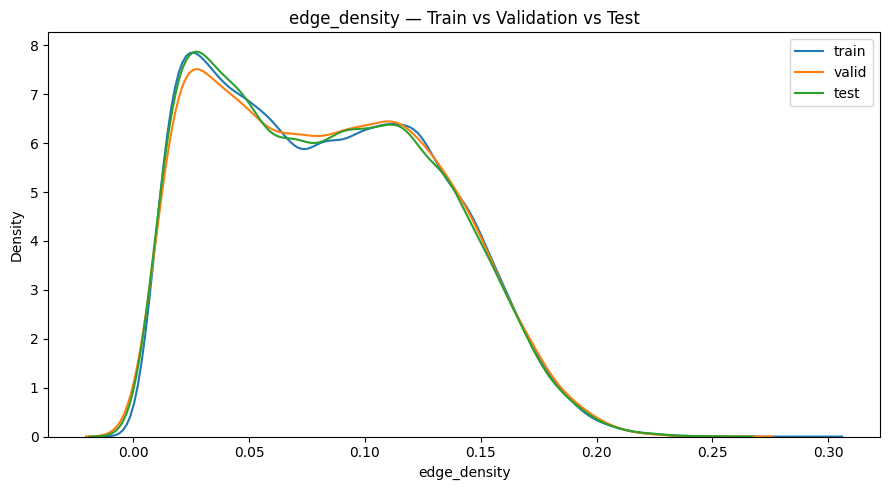

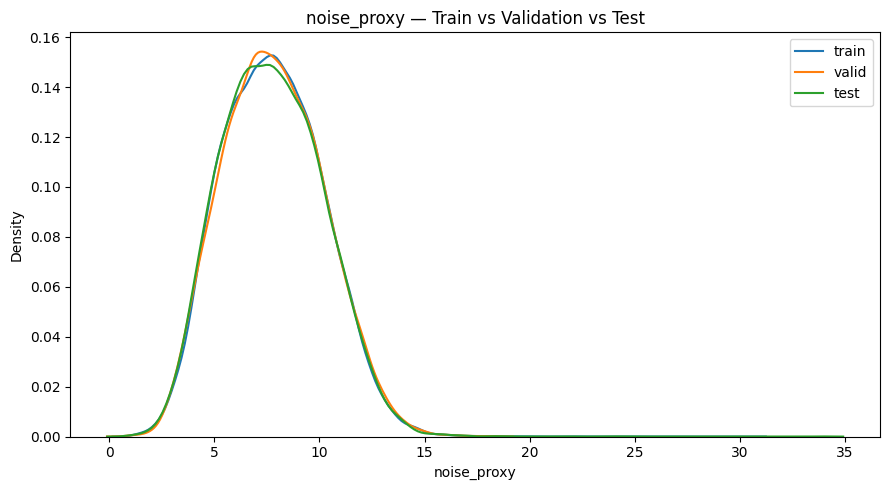

In [25]:
print("=" * 75)
print("TRAIN / VALIDATION / TEST FEATURE DISTRIBUTION")
print("=" * 75)

for feature in IQA_FEATURES:

    plt.figure(figsize=(9, 5))

    for split_name in ["train", "valid", "test"]:

        subset = iqa_df[
            iqa_df["split"] == split_name
        ][feature]

        sns.kdeplot(
            subset,
            label=split_name,
            fill=False
        )

    plt.title(
        f"{feature} — Train vs Validation vs Test"
    )

    plt.xlabel(feature)
    plt.ylabel("Density")
    plt.legend()

    plt.tight_layout()
    plt.show()

Identify Extreme Images

In [26]:
print("=" * 75)
print("EXTREME IMAGE IDENTIFICATION")
print("=" * 75)

extreme_percentile = 0.01

extreme_records = []

for feature in IQA_FEATURES:

    low_threshold = iqa_df[feature].quantile(
        extreme_percentile
    )

    high_threshold = iqa_df[feature].quantile(
        1 - extreme_percentile
    )

    low_count = (
        iqa_df[feature] <= low_threshold
    ).sum()

    high_count = (
        iqa_df[feature] >= high_threshold
    ).sum()

    extreme_records.append({
        "Feature": feature,
        "Low Threshold (P01)": low_threshold,
        "Low Images": low_count,
        "High Threshold (P99)": high_threshold,
        "High Images": high_count
    })

extreme_df = pd.DataFrame(
    extreme_records
)

display(
    extreme_df.round(4)
)

EXTREME IMAGE IDENTIFICATION


,Feature,Low Threshold (P01),Low Images,High Threshold (P99),High Images
0,mean_brightness,9.4387,1000,145.4219,1000
1,brightness_std,14.4288,1000,78.1655,1000
2,rms_contrast,14.4288,1000,78.1655,1000
3,laplacian_variance,123.4111,1000,2816.0374,1000
4,tenengrad,1711.1511,1000,28813.5748,1000
5,entropy,4.2641,1000,7.7638,1000
6,dark_pixel_ratio,0.0114,1001,0.9725,1000
7,bright_pixel_ratio,0.0002,1013,0.2365,1000
8,mean_saturation,21.8357,1000,181.7677,1000
9,saturation_std,17.0910,1000,90.4650,1000


Save Research Analysis Tables

In [27]:
# ==========================================================
# Save Notebook 4 Research Analysis Tables
# ==========================================================

NOTEBOOK4_RESULTS = RESULTS_PATH / "notebook4_analysis"

NOTEBOOK4_RESULTS.mkdir(
    parents=True,
    exist_ok=True
)

correlation_pairs_all_df.to_csv(
    NOTEBOOK4_RESULTS /
    "correlation_pairs_all.csv",
    index=False
)

percentile_table.to_csv(
    NOTEBOOK4_RESULTS /
    "feature_percentiles.csv"
)

variability_table.to_csv(
    NOTEBOOK4_RESULTS /
    "feature_variability.csv",
    index=False
)

outlier_df.to_csv(
    NOTEBOOK4_RESULTS /
    "feature_outliers.csv",
    index=False
)

extreme_df.to_csv(
    NOTEBOOK4_RESULTS /
    "extreme_feature_ranges.csv",
    index=False
)

print("=" * 75)
print("Notebook 4 Analysis Tables Saved")
print("=" * 75)

print(f"Output Directory : {NOTEBOOK4_RESULTS}")

print()
print("✓ correlation_pairs_all.csv")
print("✓ feature_percentiles.csv")
print("✓ feature_variability.csv")
print("✓ feature_outliers.csv")
print("✓ extreme_feature_ranges.csv")

Notebook 4 Analysis Tables Saved
Output Directory : E:\ML_Project\results\notebook4_analysis

✓ correlation_pairs_all.csv
✓ feature_percentiles.csv
✓ feature_variability.csv
✓ feature_outliers.csv
✓ extreme_feature_ranges.csv


Load/Verify the Correlated Pairs

In [28]:
# ==========================================================
# PART B — FEATURE REDUNDANCY DECISION
# Cell 28: Verify Strongly Correlated Feature Pairs
# ==========================================================

print("=" * 75)
print("PART B — FEATURE REDUNDANCY DECISION")
print("=" * 75)

# Recalculate the strong correlation pairs directly
correlation_threshold = 0.90

strong_pairs = []

for i in range(len(IQA_FEATURES)):

    for j in range(i + 1, len(IQA_FEATURES)):

        feature_1 = IQA_FEATURES[i]
        feature_2 = IQA_FEATURES[j]

        correlation = iqa_df[
            [feature_1, feature_2]
        ].corr().iloc[0, 1]

        if abs(correlation) >= correlation_threshold:

            strong_pairs.append({
                "Feature 1": feature_1,
                "Feature 2": feature_2,
                "Correlation": correlation,
                "Absolute Correlation": abs(correlation)
            })

strong_pairs_df = pd.DataFrame(strong_pairs)

strong_pairs_df = (
    strong_pairs_df
    .sort_values(
        "Absolute Correlation",
        ascending=False
    )
    .reset_index(drop=True)
)

print(f"Threshold : |r| >= {correlation_threshold}")
print(f"Strongly correlated pairs : {len(strong_pairs_df)}")

print()

display(
    strong_pairs_df.round(4)
)

PART B — FEATURE REDUNDANCY DECISION
Threshold : |r| >= 0.9
Strongly correlated pairs : 7



,Feature 1,Feature 2,Correlation,Absolute Correlation
0,brightness_std,rms_contrast,1.0000,1.0000
1,mean_brightness,dark_pixel_ratio,-0.9641,0.9641
2,laplacian_variance,noise_proxy,0.9617,0.9617
3,entropy,dark_pixel_ratio,-0.9276,0.9276
4,laplacian_variance,tenengrad,0.9236,0.9236
5,tenengrad,edge_density,0.9020,0.9020
6,tenengrad,noise_proxy,0.9014,0.9014


Check for Exact Duplicate Features

In [29]:
# ==========================================================
# Cell 29: Exact Duplicate Feature Check
# ==========================================================

print("=" * 75)
print("EXACT DUPLICATE FEATURE CHECK")
print("=" * 75)

duplicate_results = []

for i in range(len(IQA_FEATURES)):

    for j in range(i + 1, len(IQA_FEATURES)):

        feature_1 = IQA_FEATURES[i]
        feature_2 = IQA_FEATURES[j]

        values_1 = iqa_df[feature_1].to_numpy()
        values_2 = iqa_df[feature_2].to_numpy()

        exact_equal = np.array_equal(
            values_1,
            values_2
        )

        max_difference = np.max(
            np.abs(values_1 - values_2)
        )

        duplicate_results.append({
            "Feature 1": feature_1,
            "Feature 2": feature_2,
            "Exact Match": exact_equal,
            "Maximum Absolute Difference": max_difference
        })

duplicate_df = pd.DataFrame(
    duplicate_results
)

exact_duplicates = duplicate_df[
    duplicate_df["Exact Match"] == True
]

display(
    duplicate_df[
        duplicate_df["Maximum Absolute Difference"] < 1e-10
    ].round(12)
)

print()

if len(exact_duplicates) > 0:

    print("⚠ Exact duplicate feature pair(s) detected:")

    for _, row in exact_duplicates.iterrows():

        print(
            f"• {row['Feature 1']} ↔ "
            f"{row['Feature 2']}"
        )

else:

    print("✓ No exact duplicate feature pairs detected.")

EXACT DUPLICATE FEATURE CHECK


,Feature 1,Feature 2,Exact Match,Maximum Absolute Difference
12,brightness_std,rms_contrast,True,0.0



⚠ Exact duplicate feature pair(s) detected:
• brightness_std ↔ rms_contrast


Redundancy Decision Table. This will classify the seven pairs without automatically deleting anything.

In [30]:
print("=" * 75)
print("FEATURE REDUNDANCY DECISION TABLE")
print("=" * 75)

redundancy_decisions = []

for _, row in strong_pairs_df.iterrows():

    feature_1 = row["Feature 1"]
    feature_2 = row["Feature 2"]
    correlation = row["Correlation"]

    exact_match = duplicate_df[
        (
            (duplicate_df["Feature 1"] == feature_1) &
            (duplicate_df["Feature 2"] == feature_2)
        )
    ]["Exact Match"].iloc[0]

    if exact_match:

        decision = "EXACT DUPLICATE — REMOVE ONE"

    elif abs(correlation) >= 0.95:

        decision = "HIGH REDUNDANCY — INVESTIGATE"

    else:

        decision = "RELATED — RETAIN FOR NOW"

    redundancy_decisions.append({
        "Feature 1": feature_1,
        "Feature 2": feature_2,
        "Correlation": correlation,
        "Exact Match": exact_match,
        "Decision": decision
    })

redundancy_decision_df = pd.DataFrame(
    redundancy_decisions
)

display(
    redundancy_decision_df.round(4)
)

FEATURE REDUNDANCY DECISION TABLE


,Feature 1,Feature 2,Correlation,Exact Match,Decision
0,brightness_std,rms_contrast,1.0000,True,EXACT DUPLICATE — REMOVE ONE
1,mean_brightness,dark_pixel_ratio,-0.9641,False,HIGH REDUNDANCY — INVESTIGATE
2,laplacian_variance,noise_proxy,0.9617,False,HIGH REDUNDANCY — INVESTIGATE
3,entropy,dark_pixel_ratio,-0.9276,False,RELATED — RETAIN FOR NOW
4,laplacian_variance,tenengrad,0.9236,False,RELATED — RETAIN FOR NOW
5,tenengrad,edge_density,0.9020,False,RELATED — RETAIN FOR NOW
6,tenengrad,noise_proxy,0.9014,False,RELATED — RETAIN FOR NOW


Conceptual Feature Mapping. As we will connect the numerical features to the research concepts.

In [31]:
# ==========================================================
# Cell 31: IQA Feature → Research Concept Mapping
# ==========================================================

feature_mapping = {
    "mean_brightness": "Brightness",
    "brightness_std": "Brightness / Intensity Variation",
    "rms_contrast": "Contrast",
    "laplacian_variance": "Blur / Sharpness",
    "tenengrad": "Blur / Sharpness",
    "entropy": "Entropy",
    "dark_pixel_ratio": "Underexposure / Darkness",
    "bright_pixel_ratio": "Overexposure / Highlight Saturation",
    "mean_saturation": "Colour",
    "saturation_std": "Colour Variation",
    "colorfulness": "Colour",
    "edge_density": "Structural Detail",
    "noise_proxy": "Noise / High-Frequency Degradation"
}

mapping_df = pd.DataFrame(
    [
        {
            "Feature": feature,
            "Research Concept": feature_mapping[feature]
        }
        for feature in IQA_FEATURES
    ]
)

print("=" * 75)
print("IQA FEATURE → RESEARCH CONCEPT MAPPING")
print("=" * 75)

display(mapping_df)

IQA FEATURE → RESEARCH CONCEPT MAPPING


,Feature,Research Concept
0,mean_brightness,Brightness
1,brightness_std,Brightness / Intensity Variation
2,rms_contrast,Contrast
3,laplacian_variance,Blur / Sharpness
4,tenengrad,Blur / Sharpness
5,entropy,Entropy
6,dark_pixel_ratio,Underexposure / Darkness
7,bright_pixel_ratio,Overexposure / Highlight Saturation
8,mean_saturation,Colour
9,saturation_std,Colour Variation


Candidate Redundancy Removal. Therefore, we will make a a provisional, not final, decision.

In [32]:
provisional_remove = []
provisional_reason = {}

# Check whether brightness_std and rms_contrast
# are exactly identical before removing anything.

if (
    "brightness_std" in IQA_FEATURES and
    "rms_contrast" in IQA_FEATURES
):

    brightness_std_values = (
        iqa_df["brightness_std"].to_numpy()
    )

    rms_contrast_values = (
        iqa_df["rms_contrast"].to_numpy()
    )

    exact_match = np.array_equal(
        brightness_std_values,
        rms_contrast_values
    )

    if exact_match:

        provisional_remove.append(
            "brightness_std"
        )

        provisional_reason[
            "brightness_std"
        ] = (
            "Exact duplicate of rms_contrast; "
            "rms_contrast retained to represent the "
            "explicit contrast concept."
        )

print("=" * 75)
print("PROVISIONAL REDUNDANCY DECISION")
print("=" * 75)

if provisional_remove:

    for feature in provisional_remove:

        print(f"Remove : {feature}")
        print(f"Reason : {provisional_reason[feature]}")

else:

    print(
        "No feature will be provisionally removed "
        "at this stage."
    )

PROVISIONAL REDUNDANCY DECISION
Remove : brightness_std
Reason : Exact duplicate of rms_contrast; rms_contrast retained to represent the explicit contrast concept.


Create Provisional Feature Set

In [33]:
provisional_features = [
    feature
    for feature in IQA_FEATURES
    if feature not in provisional_remove
]

print("=" * 75)
print("PROVISIONAL IQA FEATURE SET")
print("=" * 75)

print(
    f"Original Features    : {len(IQA_FEATURES)}"
)

print(
    f"Removed Exact Duplicates : "
    f"{len(provisional_remove)}"
)

print(
    f"Provisional Features : "
    f"{len(provisional_features)}"
)

print()

for i, feature in enumerate(
    provisional_features,
    start=1
):

    print(f"{i:2d}. {feature}")

PROVISIONAL IQA FEATURE SET
Original Features    : 13
Removed Exact Duplicates : 1
Provisional Features : 12

 1. mean_brightness
 2. rms_contrast
 3. laplacian_variance
 4. tenengrad
 5. entropy
 6. dark_pixel_ratio
 7. bright_pixel_ratio
 8. mean_saturation
 9. saturation_std
10. colorfulness
11. edge_density
12. noise_proxy


Save Part B Results

In [34]:
PART_B_PATH = (
    RESULTS_PATH /
    "notebook4_analysis" /
    "part_b_redundancy"
)

PART_B_PATH.mkdir(
    parents=True,
    exist_ok=True
)

strong_pairs_df.to_csv(
    PART_B_PATH /
    "strong_correlation_pairs.csv",
    index=False
)

redundancy_decision_df.to_csv(
    PART_B_PATH /
    "redundancy_decisions.csv",
    index=False
)

mapping_df.to_csv(
    PART_B_PATH /
    "feature_concept_mapping.csv",
    index=False
)

pd.DataFrame({
    "Provisional Feature": provisional_features
}).to_csv(
    PART_B_PATH /
    "provisional_iqa_features.csv",
    index=False
)

print("=" * 75)
print("PART B RESULTS SAVED")
print("=" * 75)

print(f"Output Directory : {PART_B_PATH}")

print()
print("✓ strong_correlation_pairs.csv")
print("✓ redundancy_decisions.csv")
print("✓ feature_concept_mapping.csv")
print("✓ provisional_iqa_features.csv")

PART B RESULTS SAVED
Output Directory : E:\ML_Project\results\notebook4_analysis\part_b_redundancy

✓ strong_correlation_pairs.csv
✓ redundancy_decisions.csv
✓ feature_concept_mapping.csv
✓ provisional_iqa_features.csv


In [35]:
print("=" * 75)
print("PART C — CONDITION INTERPRETATION & FEATURE COVERAGE")
print("=" * 75)

# Use the 12-feature provisional set from Part B
ANALYSIS_FEATURES = provisional_features.copy()

print(f"Features for Part C : {len(ANALYSIS_FEATURES)}")
print()

for i, feature in enumerate(ANALYSIS_FEATURES, start=1):
    print(f"{i:2d}. {feature}")

print()
print("✓ Provisional feature set loaded.")

PART C — CONDITION INTERPRETATION & FEATURE COVERAGE
Features for Part C : 12

 1. mean_brightness
 2. rms_contrast
 3. laplacian_variance
 4. tenengrad
 5. entropy
 6. dark_pixel_ratio
 7. bright_pixel_ratio
 8. mean_saturation
 9. saturation_std
10. colorfulness
11. edge_density
12. noise_proxy

✓ Provisional feature set loaded.


Dataset-Relative Condition Ranges. We should not invent universal thresholds such as:

brightness < 50 = bad.

Instead, we'll use our own dataset's percentiles.

In [36]:
condition_ranges = []

for feature in ANALYSIS_FEATURES:

    values = iqa_df[feature]

    p10 = values.quantile(0.10)
    p25 = values.quantile(0.25)
    p50 = values.quantile(0.50)
    p75 = values.quantile(0.75)
    p90 = values.quantile(0.90)

    condition_ranges.append({
        "Feature": feature,
        "P10": p10,
        "P25": p25,
        "P50": p50,
        "P75": p75,
        "P90": p90
    })

condition_ranges_df = pd.DataFrame(
    condition_ranges
)

print("=" * 75)
print("DATASET-RELATIVE FEATURE CONDITION RANGES")
print("=" * 75)

display(
    condition_ranges_df.round(4)
)

DATASET-RELATIVE FEATURE CONDITION RANGES


,Feature,P10,P25,P50,P75,P90
0,mean_brightness,19.0202,32.8582,85.5596,105.1946,119.4590
1,rms_contrast,23.5742,34.4139,53.6352,62.2394,68.6124
2,laplacian_variance,308.7879,533.4938,943.8292,1448.2150,1921.3127
3,tenengrad,4161.3004,7357.4320,11996.1117,16786.4538,21062.5992
4,entropy,5.4007,6.1645,7.2313,7.5101,7.6307
5,dark_pixel_ratio,0.0707,0.1302,0.2557,0.7392,0.8897
6,bright_pixel_ratio,0.0018,0.0060,0.0262,0.0686,0.1159
7,mean_saturation,34.8460,49.1523,67.0306,91.9727,121.9202
8,saturation_std,25.2350,31.4659,40.6327,51.5987,62.9777
9,colorfulness,9.8797,13.9539,20.1472,30.2796,44.3561


Condition Interpretation Map

Now we explicitly connect each feature to what we believe it measures.

In [37]:
condition_interpretation = {
    "mean_brightness":
        "Overall image illumination",

    "rms_contrast":
        "Overall intensity contrast",

    "laplacian_variance":
        "Image sharpness / blur indicator",

    "tenengrad":
        "Gradient-based sharpness / edge strength",

    "entropy":
        "Image information / intensity complexity",

    "dark_pixel_ratio":
        "Dark-region / underexposure indicator",

    "bright_pixel_ratio":
        "Bright-region / overexposure indicator",

    "mean_saturation":
        "Average color saturation",

    "saturation_std":
        "Spatial/color saturation variation",

    "colorfulness":
        "Overall perceived colorfulness",

    "edge_density":
        "Amount of structural edge content",

    "noise_proxy":
        "Estimated high-frequency noise content"
}

condition_category = {
    "mean_brightness": "Brightness",
    "rms_contrast": "Contrast",
    "laplacian_variance": "Blur / Sharpness",
    "tenengrad": "Blur / Sharpness",
    "entropy": "Entropy",
    "dark_pixel_ratio": "Exposure",
    "bright_pixel_ratio": "Exposure",
    "mean_saturation": "Color",
    "saturation_std": "Color",
    "colorfulness": "Color",
    "edge_density": "Structure",
    "noise_proxy": "Noise"
}

interpretation_df = pd.DataFrame({
    "Feature": ANALYSIS_FEATURES,
    "Category": [
        condition_category[f]
        for f in ANALYSIS_FEATURES
    ],
    "Interpretation": [
        condition_interpretation[f]
        for f in ANALYSIS_FEATURES
    ]
})

print("=" * 75)
print("IQA CONDITION INTERPRETATION")
print("=" * 75)

display(interpretation_df)

IQA CONDITION INTERPRETATION


,Feature,Category,Interpretation
0,mean_brightness,Brightness,Overall image illumination
1,rms_contrast,Contrast,Overall intensity contrast
2,laplacian_variance,Blur / Sharpness,Image sharpness / blur indicator
3,tenengrad,Blur / Sharpness,Gradient-based sharpness / edge strength
4,entropy,Entropy,Image information / intensity complexity
5,dark_pixel_ratio,Exposure,Dark-region / underexposure indicator
6,bright_pixel_ratio,Exposure,Bright-region / overexposure indicator
7,mean_saturation,Color,Average color saturation
8,saturation_std,Color,Spatial/color saturation variation
9,colorfulness,Color,Overall perceived colorfulness


Research Condition Coverage

In [38]:
research_conditions = {
    "Brightness": [
        "mean_brightness"
    ],

    "Contrast": [
        "rms_contrast"
    ],

    "Blur / Sharpness": [
        "laplacian_variance",
        "tenengrad"
    ],

    "Noise": [
        "noise_proxy"
    ],

    "Entropy": [
        "entropy"
    ],

    "Exposure": [
        "dark_pixel_ratio",
        "bright_pixel_ratio"
    ],

    "Color": [
        "mean_saturation",
        "saturation_std",
        "colorfulness"
    ],

    "Structural Detail": [
        "edge_density"
    ],

    "Fog / Haze": []
}

coverage_rows = []

for condition, features in research_conditions.items():

    available_features = [
        feature
        for feature in features
        if feature in ANALYSIS_FEATURES
    ]

    coverage_rows.append({
        "Research Condition": condition,
        "Available Features": (
            ", ".join(available_features)
            if available_features
            else "NONE"
        ),
        "Coverage": (
            "Covered"
            if available_features
            else "Not Explicitly Covered"
        )
    })

coverage_df = pd.DataFrame(
    coverage_rows
)

print("=" * 75)
print("RESEARCH CONDITION COVERAGE")
print("=" * 75)

display(coverage_df)

RESEARCH CONDITION COVERAGE


,Research Condition,Available Features,Coverage
0,Brightness,mean_brightness,Covered
1,Contrast,rms_contrast,Covered
2,Blur / Sharpness,"laplacian_variance, tenengrad",Covered
3,Noise,noise_proxy,Covered
4,Entropy,entropy,Covered
5,Exposure,"dark_pixel_ratio, bright_pixel_ratio",Covered
6,Color,"mean_saturation, saturation_std, colorfulness",Covered
7,Structural Detail,edge_density,Covered
8,Fog / Haze,NONE,Not Explicitly Covered


Feature Direction Analysis

Now we determine whether a feature's direction has an intuitive relationship with the condition.

In [39]:
feature_direction = {
    "mean_brightness":
        "Lower → darker / higher → brighter",

    "rms_contrast":
        "Lower → lower contrast / higher → stronger contrast",

    "laplacian_variance":
        "Lower → potentially blurrier / higher → sharper",

    "tenengrad":
        "Lower → weaker gradients / higher → stronger gradients",

    "entropy":
        "Lower → lower intensity complexity / higher → greater complexity",

    "dark_pixel_ratio":
        "Higher → more dark pixels",

    "bright_pixel_ratio":
        "Higher → more bright pixels",

    "mean_saturation":
        "Lower → less saturated / higher → more saturated",

    "saturation_std":
        "Higher → greater saturation variation",

    "colorfulness":
        "Lower → less colorful / higher → more colorful",

    "edge_density":
        "Lower → fewer detected edges / higher → more detected edges",

    "noise_proxy":
        "Higher → greater estimated high-frequency noise"
}

direction_df = pd.DataFrame({
    "Feature": ANALYSIS_FEATURES,
    "Expected Direction": [
        feature_direction[f]
        for f in ANALYSIS_FEATURES
    ]
})

print("=" * 75)
print("FEATURE CONDITION DIRECTION")
print("=" * 75)

display(direction_df)

FEATURE CONDITION DIRECTION


,Feature,Expected Direction
0,mean_brightness,Lower → darker / higher → brighter
1,rms_contrast,Lower → lower contrast / higher → stronger con...
2,laplacian_variance,Lower → potentially blurrier / higher → sharper
3,tenengrad,Lower → weaker gradients / higher → stronger g...
4,entropy,Lower → lower intensity complexity / higher → ...
5,dark_pixel_ratio,Higher → more dark pixels
6,bright_pixel_ratio,Higher → more bright pixels
7,mean_saturation,Lower → less saturated / higher → more saturated
8,saturation_std,Higher → greater saturation variation
9,colorfulness,Lower → less colorful / higher → more colorful


Representative Extreme Images

This is where we finally connect the numbers to actual images.

We will select representative images from the lowest and highest 1% for selected condition features.

In [40]:
print("=" * 75)
print("IMAGE IDENTIFIER CHECK")
print("=" * 75)
print("Available columns:")
print()

for column in iqa_df.columns:
    print(f"- {column}")

IMAGE IDENTIFIER CHECK
Available columns:

- image_name
- image_path
- split
- mean_brightness
- brightness_std
- rms_contrast
- laplacian_variance
- tenengrad
- entropy
- dark_pixel_ratio
- bright_pixel_ratio
- mean_saturation
- saturation_std
- colorfulness
- edge_density
- noise_proxy


Find Representative Extreme Images

In [41]:
print("=" * 75)
print("REPRESENTATIVE EXTREME IMAGE SELECTION")
print("=" * 75)

# Features we want to visually inspect
inspection_features = [
    "mean_brightness",
    "rms_contrast",
    "laplacian_variance",
    "noise_proxy"
]

representative_images = []

for feature in inspection_features:

    # Lowest 1%
    low_threshold = iqa_df[feature].quantile(0.01)

    low_candidates = iqa_df[
        iqa_df[feature] <= low_threshold
    ]

    # Highest 1%
    high_threshold = iqa_df[feature].quantile(0.99)

    high_candidates = iqa_df[
        iqa_df[feature] >= high_threshold
    ]

    # Select image closest to threshold
    low_image = low_candidates.iloc[
        (low_candidates[feature] - low_threshold)
        .abs()
        .argmin()
    ]

    high_image = high_candidates.iloc[
        (high_candidates[feature] - high_threshold)
        .abs()
        .argmin()
    ]

    representative_images.append({
        "Feature": feature,
        "Condition": "Low (P01)",
        "Image Name": low_image["image_name"],
        "Image Path": low_image["image_path"],
        "Feature Value": low_image[feature]
    })

    representative_images.append({
        "Feature": feature,
        "Condition": "High (P99)",
        "Image Name": high_image["image_name"],
        "Image Path": high_image["image_path"],
        "Feature Value": high_image[feature]
    })

representative_df = pd.DataFrame(
    representative_images
)

display(
    representative_df[
        [
            "Feature",
            "Condition",
            "Image Name",
            "Feature Value",
            "Image Path"
        ]
    ].round(4)
)

REPRESENTATIVE EXTREME IMAGE SELECTION


,Feature,Condition,Image Name,Feature Value,Image Path
0,mean_brightness,Low (P01),14b50a39-3888bd4c.jpg,9.4366,E:\ML_Project\datasets\bdd100k_original_yolo\t...
1,mean_brightness,High (P99),45af8b22-3054b5f0.jpg,145.4474,E:\ML_Project\datasets\bdd100k_original_yolo\t...
2,rms_contrast,Low (P01),29885f13-5714e68b.jpg,14.4204,E:\ML_Project\datasets\bdd100k_original_yolo\t...
3,rms_contrast,High (P99),04629c39-69d7c08c.jpg,78.1718,E:\ML_Project\datasets\bdd100k_original_yolo\t...
4,laplacian_variance,Low (P01),05584a52-687411b6.jpg,123.4002,E:\ML_Project\datasets\bdd100k_original_yolo\t...
5,laplacian_variance,High (P99),58cf4141-189ee865.jpg,2816.4048,E:\ML_Project\datasets\bdd100k_original_yolo\t...
6,noise_proxy,Low (P01),45bec154-111e841e.jpg,2.9837,E:\ML_Project\datasets\bdd100k_original_yolo\t...
7,noise_proxy,High (P99),ca4bdfab-34ec6a3a.jpg,13.4448,E:\ML_Project\datasets\bdd100k_original_yolo\v...


Verify Representative Image Files

In [42]:
print("=" * 75)
print("REPRESENTATIVE IMAGE PATH VERIFICATION")
print("=" * 75)

representative_df["Exists"] = (
    representative_df["Image Path"]
    .apply(lambda x: Path(x).exists())
)

display(
    representative_df[
        [
            "Feature",
            "Condition",
            "Image Name",
            "Image Path",
            "Exists"
        ]
    ]
)

missing_count = (
    (~representative_df["Exists"])
    .sum()
)

print()

if missing_count == 0:
    print("✓ All representative image files found.")
else:
    print(
        f"✗ {missing_count} representative image file(s) "
        "could not be found."
    )

REPRESENTATIVE IMAGE PATH VERIFICATION


,Feature,Condition,Image Name,Image Path,Exists
0,mean_brightness,Low (P01),14b50a39-3888bd4c.jpg,E:\ML_Project\datasets\bdd100k_original_yolo\t...,True
1,mean_brightness,High (P99),45af8b22-3054b5f0.jpg,E:\ML_Project\datasets\bdd100k_original_yolo\t...,True
2,rms_contrast,Low (P01),29885f13-5714e68b.jpg,E:\ML_Project\datasets\bdd100k_original_yolo\t...,True
3,rms_contrast,High (P99),04629c39-69d7c08c.jpg,E:\ML_Project\datasets\bdd100k_original_yolo\t...,True
4,laplacian_variance,Low (P01),05584a52-687411b6.jpg,E:\ML_Project\datasets\bdd100k_original_yolo\t...,True
5,laplacian_variance,High (P99),58cf4141-189ee865.jpg,E:\ML_Project\datasets\bdd100k_original_yolo\t...,True
6,noise_proxy,Low (P01),45bec154-111e841e.jpg,E:\ML_Project\datasets\bdd100k_original_yolo\t...,True
7,noise_proxy,High (P99),ca4bdfab-34ec6a3a.jpg,E:\ML_Project\datasets\bdd100k_original_yolo\v...,True



✓ All representative image files found.


Display Representative Images

VISUAL INSPECTION OF EXTREME IQA CONDITIONS


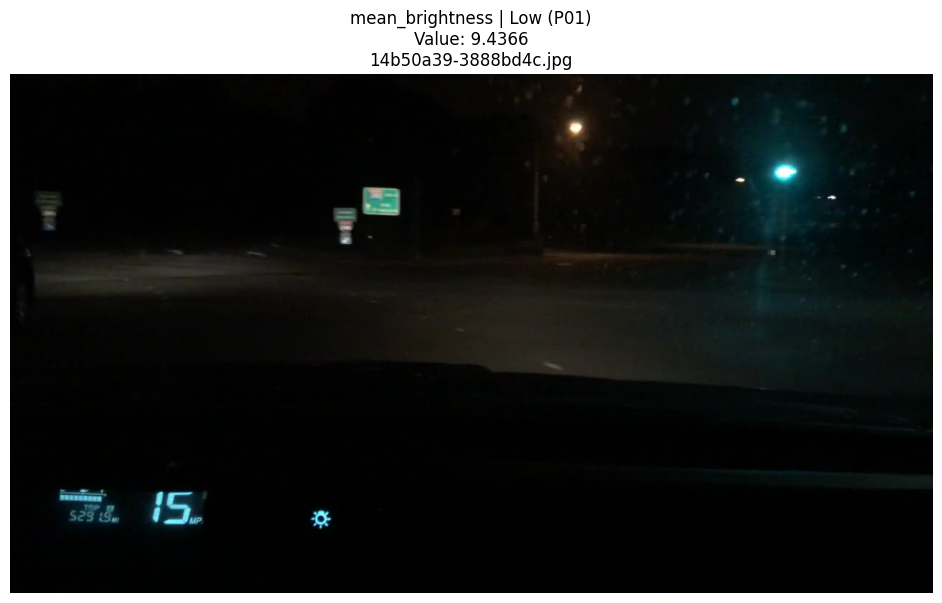

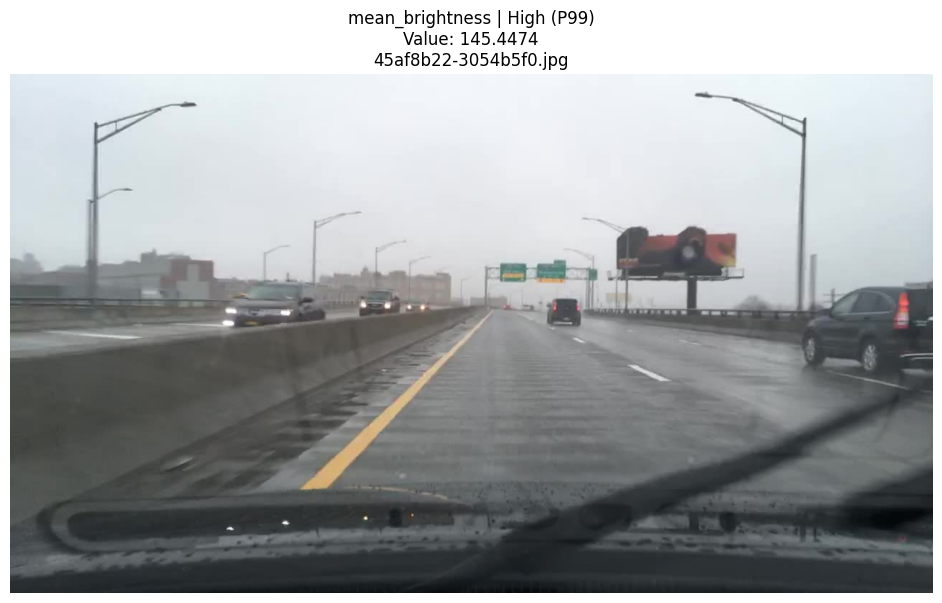

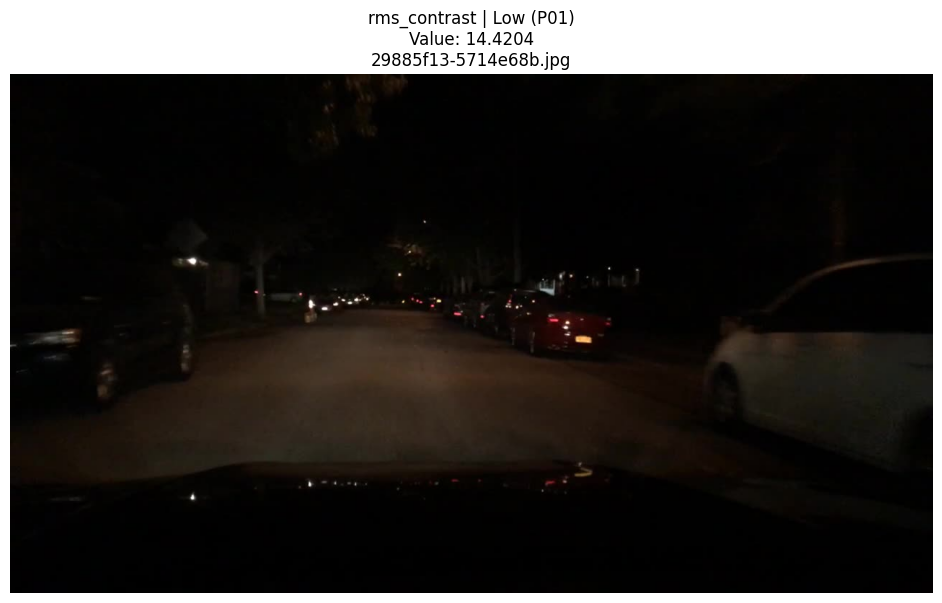

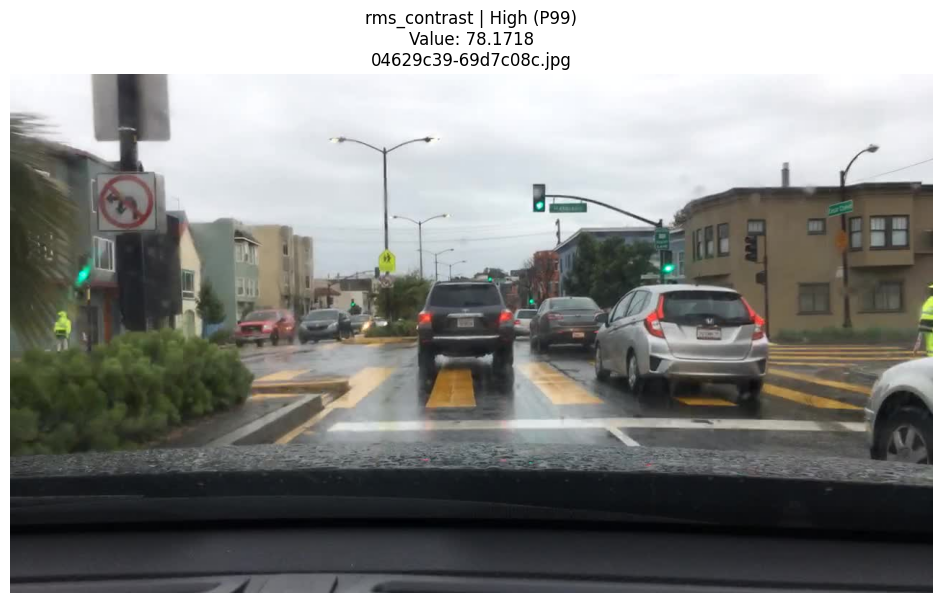

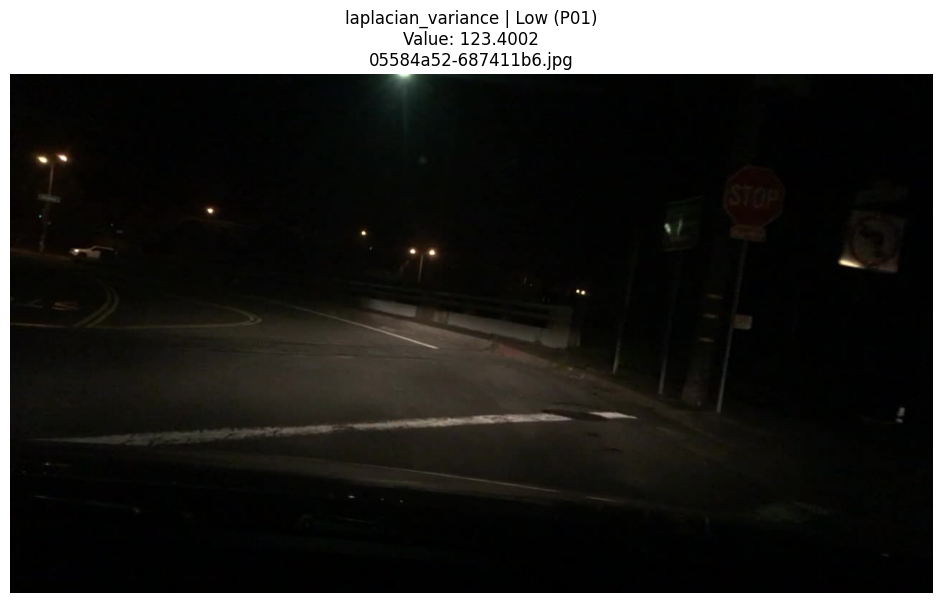

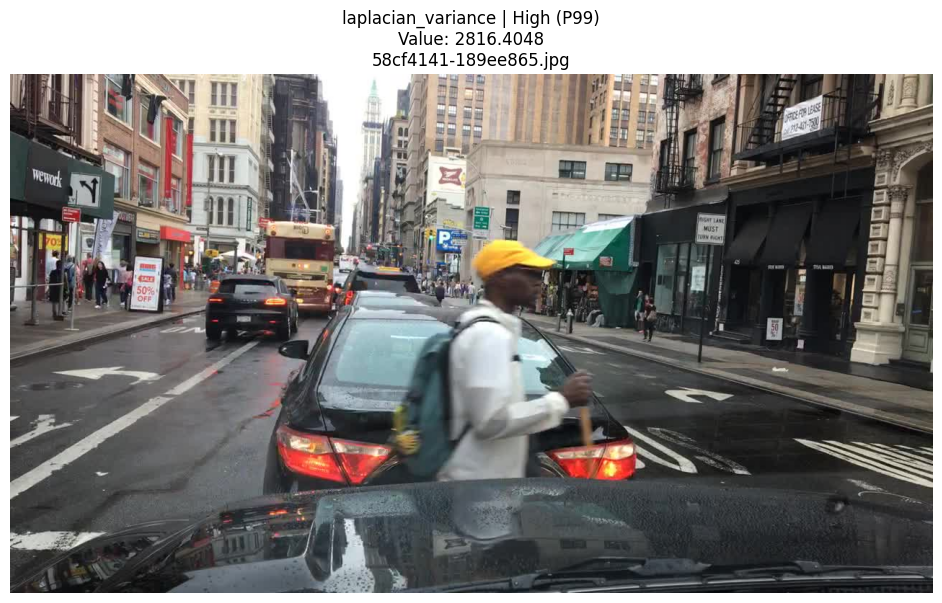

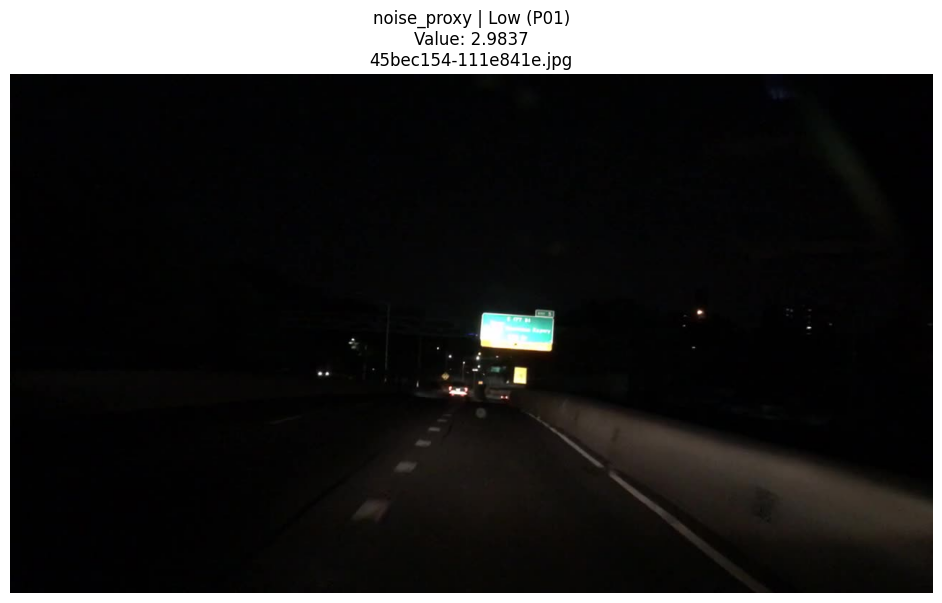

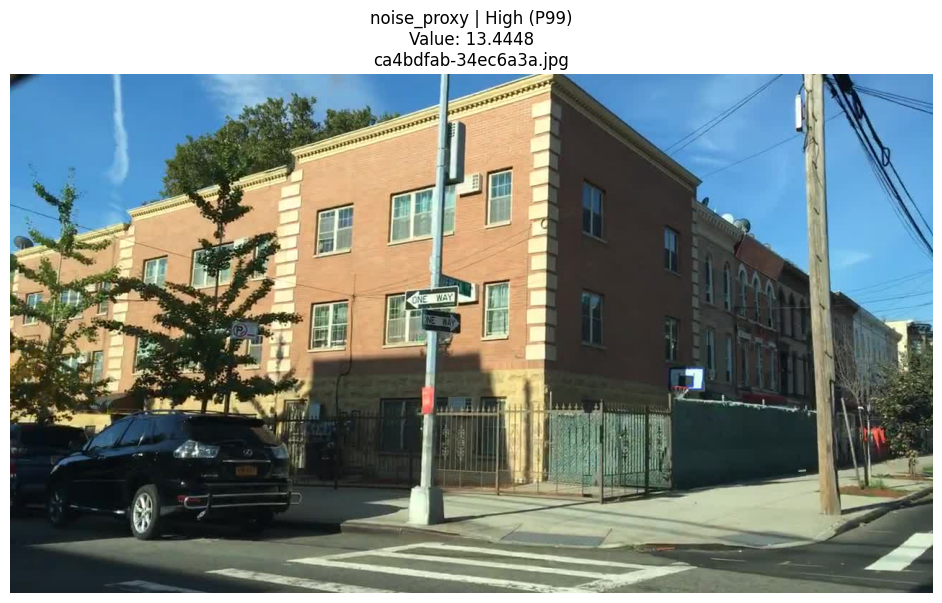

In [43]:
from PIL import Image

print("=" * 75)
print("VISUAL INSPECTION OF EXTREME IQA CONDITIONS")
print("=" * 75)

for _, row in representative_df.iterrows():

    image_path = Path(row["Image Path"])

    image = Image.open(image_path)

    plt.figure(figsize=(10, 6))

    plt.imshow(image)
    plt.axis("off")

    plt.title(
        f"{row['Feature']} | "
        f"{row['Condition']}\n"
        f"Value: {row['Feature Value']:.4f}\n"
        f"{row['Image Name']}"
    )

    plt.tight_layout()
    plt.show()

Inspect BDD100K metadata availability

In [44]:
# ==========================================================
# Check for Weather / Scene Metadata in IQA Dataset
# ==========================================================

print("=" * 75)
print("IQA DATASET METADATA CHECK")
print("=" * 75)

metadata_keywords = [
    "weather",
    "condition",
    "scene",
    "time",
    "timeofday",
    "weather_condition",
    "category"
]

possible_metadata_columns = []

for column in iqa_df.columns:

    column_lower = column.lower()

    if any(
        keyword in column_lower
        for keyword in metadata_keywords
    ):
        possible_metadata_columns.append(column)

if possible_metadata_columns:

    print("Potential metadata columns found:")
    print()

    for column in possible_metadata_columns:
        print(f"- {column}")

else:

    print(
        "No explicit weather/scene metadata columns "
        "were found in iqa_df."
    )

print()
print("Total columns:", len(iqa_df.columns))

print()
print("✓ IQA dataset metadata check completed.")
print("Note: Weather/scene metadata is stored separately "
      "for stratified analysis.")

IQA DATASET METADATA CHECK
No explicit weather/scene metadata columns were found in iqa_df.

Total columns: 16

✓ IQA dataset metadata check completed.
Note: Weather/scene metadata is stored separately for stratified analysis.


Build a Feature Coverage Summary

In [45]:
coverage_summary = [
    {
        "Research Condition": "Brightness",
        "Current Feature(s)": "mean_brightness",
        "Status": "Directly represented"
    },
    {
        "Research Condition": "Contrast",
        "Current Feature(s)": "rms_contrast",
        "Status": "Directly represented"
    },
    {
        "Research Condition": "Blur / Sharpness",
        "Current Feature(s)": (
            "laplacian_variance, tenengrad"
        ),
        "Status": "Represented by two measures"
    },
    {
        "Research Condition": "Noise",
        "Current Feature(s)": "noise_proxy",
        "Status": "Represented by proxy"
    },
    {
        "Research Condition": "Entropy",
        "Current Feature(s)": "entropy",
        "Status": "Directly represented"
    },
    {
        "Research Condition": "Exposure",
        "Current Feature(s)": (
            "dark_pixel_ratio, bright_pixel_ratio"
        ),
        "Status": "Represented"
    },
    {
        "Research Condition": "Color",
        "Current Feature(s)": (
            "mean_saturation, saturation_std, colorfulness"
        ),
        "Status": "Represented"
    },
    {
        "Research Condition": "Structural Detail",
        "Current Feature(s)": "edge_density",
        "Status": "Represented"
    },
    {
        "Research Condition": "Fog / Haze",
        "Current Feature(s)": "None",
        "Status": "NO EXPLICIT FEATURE"
    }
]

coverage_summary_df = pd.DataFrame(
    coverage_summary
)

print("=" * 75)
print("PART C — FEATURE COVERAGE SUMMARY")
print("=" * 75)

display(coverage_summary_df)

PART C — FEATURE COVERAGE SUMMARY


,Research Condition,Current Feature(s),Status
0,Brightness,mean_brightness,Directly represented
1,Contrast,rms_contrast,Directly represented
2,Blur / Sharpness,"laplacian_variance, tenengrad",Represented by two measures
3,Noise,noise_proxy,Represented by proxy
4,Entropy,entropy,Directly represented
5,Exposure,"dark_pixel_ratio, bright_pixel_ratio",Represented
6,Color,"mean_saturation, saturation_std, colorfulness",Represented
7,Structural Detail,edge_density,Represented
8,Fog / Haze,None,NO EXPLICIT FEATURE


Check Whether Existing Features Have Potential Haze Information

POTENTIAL HAZE-RELATED FEATURE RELATIONSHIPS


,rms_contrast,entropy,edge_density,laplacian_variance,tenengrad,mean_brightness
rms_contrast,1.0000,0.8711,0.6853,0.5741,0.6418,0.8504
entropy,0.8711,1.0000,0.7922,0.6402,0.7057,0.8994
edge_density,0.6853,0.7922,1.0000,0.8888,0.9020,0.7320
laplacian_variance,0.5741,0.6402,0.8888,1.0000,0.9236,0.5713
tenengrad,0.6418,0.7057,0.9020,0.9236,1.0000,0.6256
mean_brightness,0.8504,0.8994,0.7320,0.5713,0.6256,1.0000


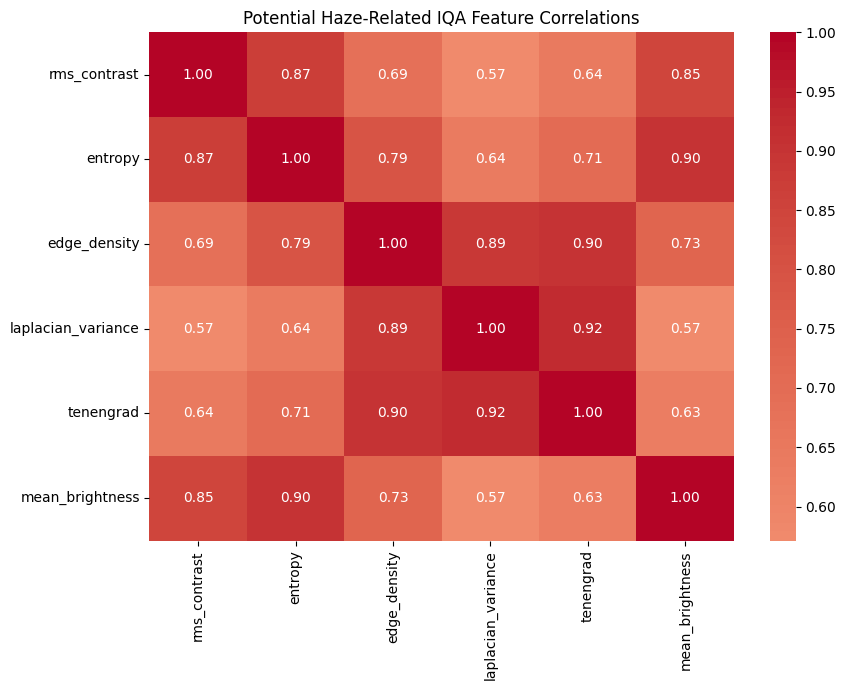

In [46]:
haze_related_features = [
    "rms_contrast",
    "entropy",
    "edge_density",
    "laplacian_variance",
    "tenengrad",
    "mean_brightness"
]

haze_corr = (
    iqa_df[haze_related_features]
    .corr()
)

print("=" * 75)
print("POTENTIAL HAZE-RELATED FEATURE RELATIONSHIPS")
print("=" * 75)

display(
    haze_corr.round(4)
)

plt.figure(figsize=(9, 7))

sns.heatmap(
    haze_corr,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    center=0
)

plt.title(
    "Potential Haze-Related IQA Feature Correlations"
)

plt.tight_layout()
plt.show()

Identify Candidate Low-Visibility Images

In [47]:
visibility_features = [
    "rms_contrast",
    "edge_density",
    "laplacian_variance",
    "tenengrad"
]

visibility_rank = pd.DataFrame(index=iqa_df.index)

for feature in visibility_features:

    # Convert each feature into percentile rank
    visibility_rank[feature] = (
        iqa_df[feature]
        .rank(pct=True)
    )

# Lower values indicate lower contrast/detail/sharpness.
visibility_rank["low_visibility_score"] = (
    (1 - visibility_rank["rms_contrast"]) +
    (1 - visibility_rank["edge_density"]) +
    (1 - visibility_rank["laplacian_variance"]) +
    (1 - visibility_rank["tenengrad"])
) / len(visibility_features)

# Attach identifiers
visibility_candidates = iqa_df[
    ["image_name", "image_path", "split"]
].copy()

visibility_candidates[
    "low_visibility_score"
] = visibility_rank[
    "low_visibility_score"
]

visibility_candidates = (
    visibility_candidates
    .sort_values(
        "low_visibility_score",
        ascending=False
    )
)

print("=" * 75)
print("LOW-VISIBILITY CANDIDATE IMAGES")
print("=" * 75)

display(
    visibility_candidates.head(20)
)

LOW-VISIBILITY CANDIDATE IMAGES


,image_name,image_path,split,low_visibility_score
90799,e6a13af1-8252572b.jpg,E:\ML_Project\datasets\bdd100k_original_yolo\t...,test,0.999988
10807,1bea510c-d7f4d911.jpg,E:\ML_Project\datasets\bdd100k_original_yolo\t...,train,0.999883
95195,f1537f75-f24881eb.jpg,E:\ML_Project\datasets\bdd100k_original_yolo\t...,test,0.999861
39561,6500741d-59e46790.jpg,E:\ML_Project\datasets\bdd100k_original_yolo\t...,train,0.999830
59764,98a302bb-98ae95a3.jpg,E:\ML_Project\datasets\bdd100k_original_yolo\t...,train,0.999818
66888,aa6cef25-1afd9669.jpg,E:\ML_Project\datasets\bdd100k_original_yolo\t...,train,0.999776
52002,84bd30cf-f8f622f0.jpg,E:\ML_Project\datasets\bdd100k_original_yolo\t...,train,0.999734
58059,94796170-e89cceb4.jpg,E:\ML_Project\datasets\bdd100k_original_yolo\t...,train,0.999713
26422,43807e1f-9045e50c.jpg,E:\ML_Project\datasets\bdd100k_original_yolo\t...,train,0.999697
47156,782e5511-0fb3088f.jpg,E:\ML_Project\datasets\bdd100k_original_yolo\t...,train,0.999628


Display Candidate Low-Visibility Images

VISUAL INSPECTION — LOW-VISIBILITY CANDIDATES


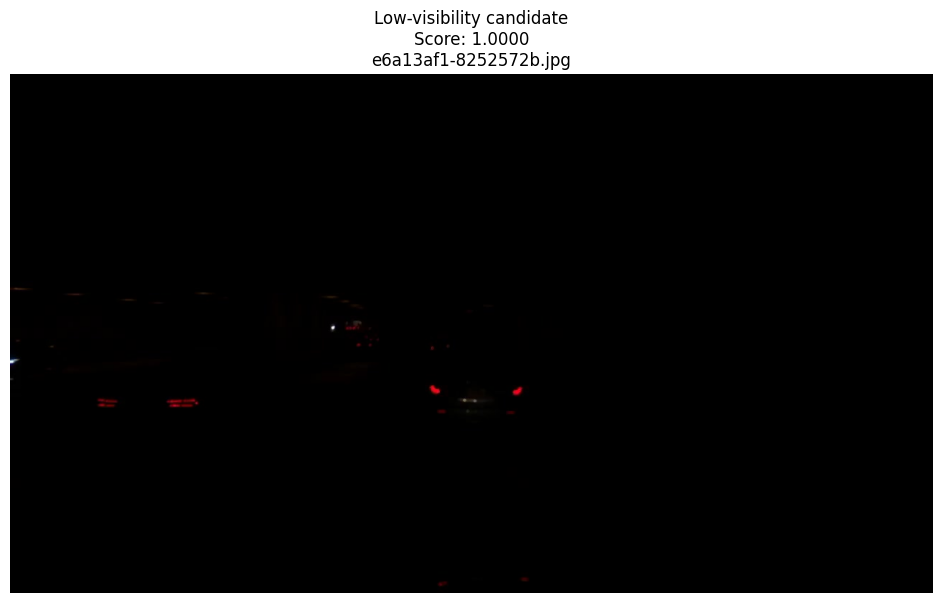

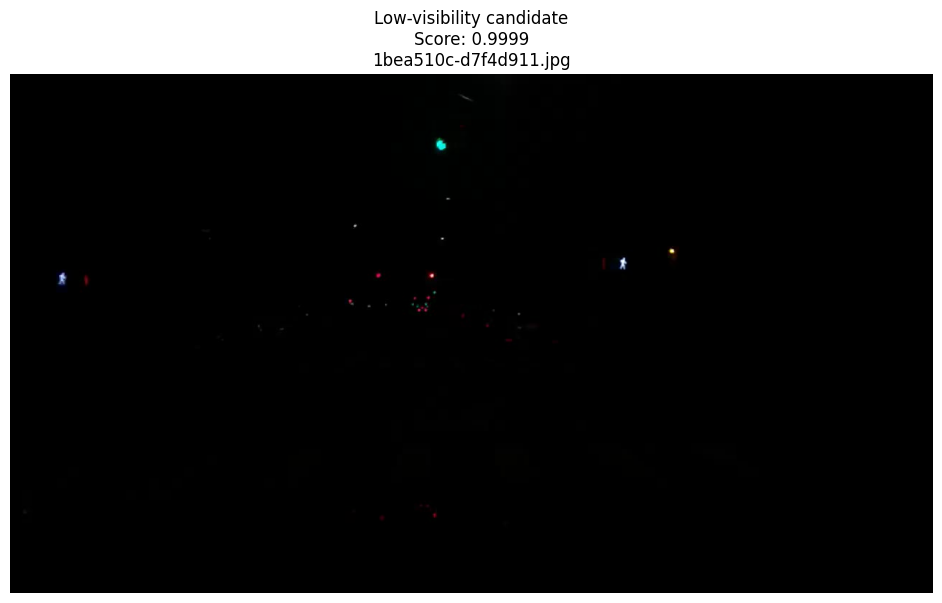

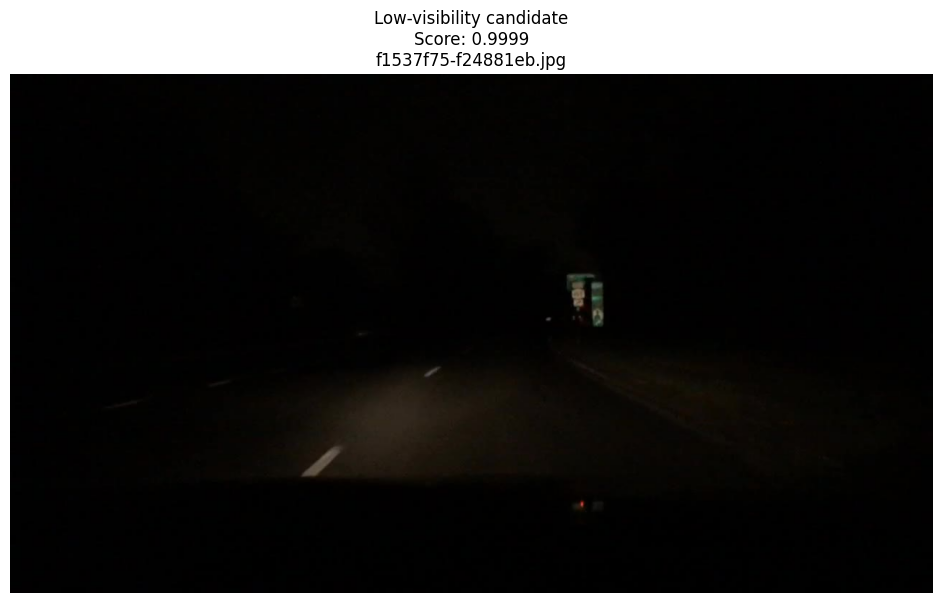

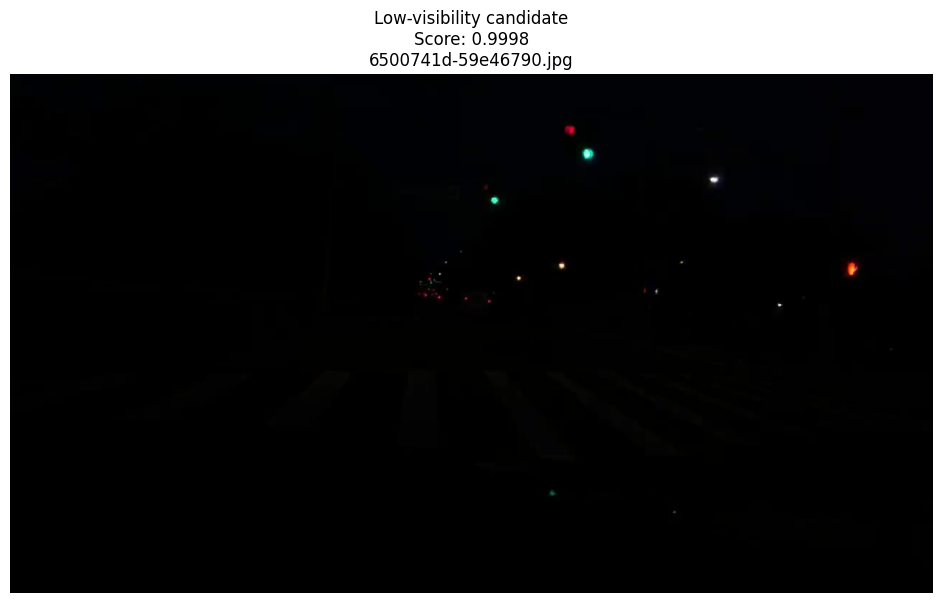

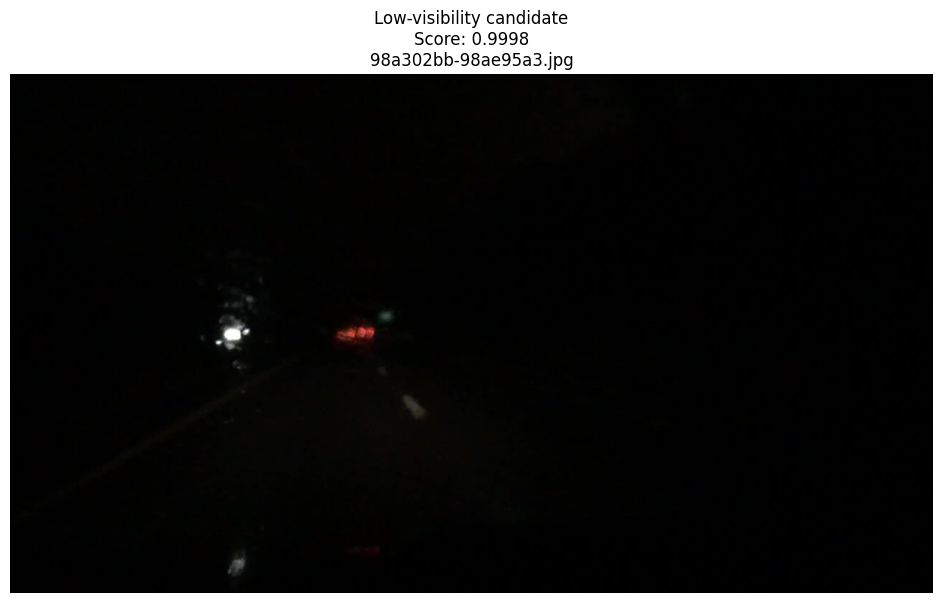

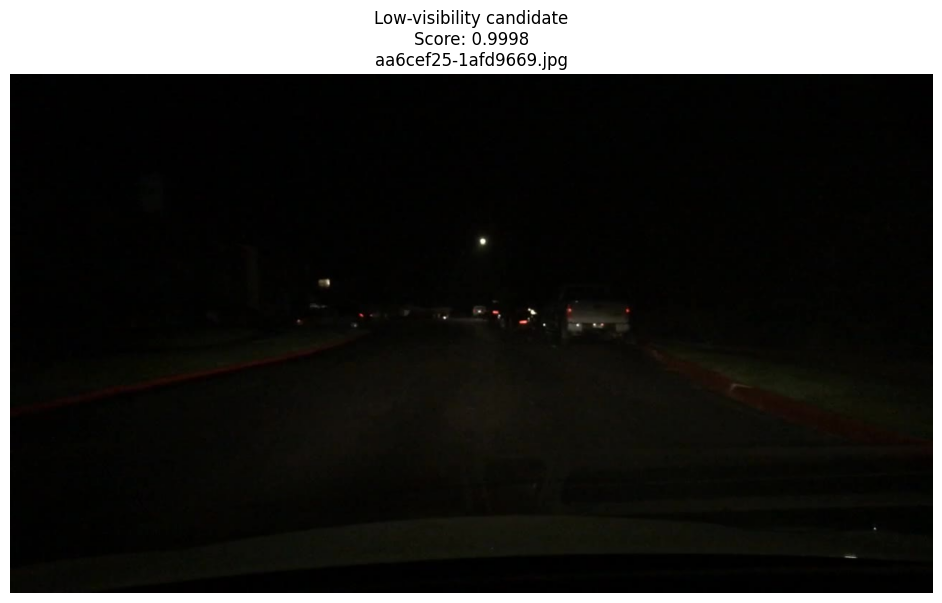

In [48]:
from PIL import Image

top_candidates = visibility_candidates.head(6)

print("=" * 75)
print("VISUAL INSPECTION — LOW-VISIBILITY CANDIDATES")
print("=" * 75)

for _, row in top_candidates.iterrows():

    image_path = Path(row["image_path"])

    if not image_path.exists():
        print(
            f"Image not found: {image_path}"
        )
        continue

    image = Image.open(image_path)

    plt.figure(figsize=(10, 6))

    plt.imshow(image)
    plt.axis("off")

    plt.title(
        f"Low-visibility candidate\n"
        f"Score: {row['low_visibility_score']:.4f}\n"
        f"{row['image_name']}"
    )

    plt.tight_layout()
    plt.show()

In [ ]:
Define Part D candidates_FEATURE ENGINEERING & MISSING-FEATURE INVESTIGATION. So, we will define Candidate Feature Definition.

In [49]:
print("=" * 75)
print("PART D — FEATURE ENGINEERING")
print("=" * 75)

candidate_features = {
    "fog_haze_proxy":
        "Dark-channel based haze/visibility proxy",

    "motion_blur_proxy":
        "Directional gradient anisotropy proxy"
}

for feature, description in candidate_features.items():
    print(f"• {feature}")
    print(f"  {description}")

print()
print("✓ Candidate feature definitions prepared.")

PART D — FEATURE ENGINEERING
• fog_haze_proxy
  Dark-channel based haze/visibility proxy
• motion_blur_proxy
  Directional gradient anisotropy proxy

✓ Candidate feature definitions prepared.


Implement Fog/Haze Proxy

In [50]:
def compute_fog_haze_proxy(image):
    """
    Estimate a simple haze/fog proxy using the
    mean dark-channel response.

    Higher values generally indicate stronger
    atmospheric veil / reduced dark-channel behaviour.

    This is a proxy, NOT ground-truth fog density.
    """

    image_rgb = np.asarray(image).astype(np.float32)

    # Normalize RGB to [0, 1]
    image_rgb = image_rgb / 255.0

    # Minimum intensity across RGB channels
    dark_channel = np.min(
        image_rgb,
        axis=2
    )

    # 3x3 minimum filter approximation
    padded = np.pad(
        dark_channel,
        pad_width=1,
        mode="edge"
    )

    local_min = np.minimum.reduce([
        padded[:-2, :-2],
        padded[:-2, 1:-1],
        padded[:-2, 2:],
        padded[1:-1, :-2],
        padded[1:-1, 1:-1],
        padded[1:-1, 2:],
        padded[2:, :-2],
        padded[2:, 1:-1],
        padded[2:, 2:]
    ])

    return float(
        np.mean(local_min)
    )


print("✓ Fog/haze proxy function defined.")

✓ Fog/haze proxy function defined.


Implement Motion-Blur Proxy

In [51]:
import cv2
def compute_motion_blur_proxy(image):
    """
    Estimate directional blur tendency from horizontal
    and vertical gradient energy.

    This is a motion-blur PROXY, not a ground-truth
    motion-blur detector.
    """

    image_rgb = np.asarray(image)

    gray = cv2.cvtColor(
        image_rgb,
        cv2.COLOR_RGB2GRAY
    )

    gray = gray.astype(np.float32)

    gx = cv2.Sobel(
        gray,
        cv2.CV_32F,
        1,
        0,
        ksize=3
    )

    gy = cv2.Sobel(
        gray,
        cv2.CV_32F,
        0,
        1,
        ksize=3
    )

    horizontal_energy = np.mean(
        gx ** 2
    )

    vertical_energy = np.mean(
        gy ** 2
    )

    denominator = (
        horizontal_energy +
        vertical_energy +
        1e-8
    )

    directional_imbalance = (
        abs(
            horizontal_energy -
            vertical_energy
        )
        / denominator
    )

    return float(
        directional_imbalance
    )


print("✓ Motion-blur proxy function defined.")

✓ Motion-blur proxy function defined.


Test Both Candidates on One Image

In [52]:
test_image_path = Path(
    iqa_df.iloc[0]["image_path"]
)

test_image = Image.open(
    test_image_path
).convert("RGB")

fog_value = compute_fog_haze_proxy(
    test_image
)

motion_value = compute_motion_blur_proxy(
    test_image
)

print("=" * 75)
print("CANDIDATE FEATURE TEST")
print("=" * 75)

print(f"Image               : {test_image_path.name}")
print(f"Fog/Haze Proxy      : {fog_value:.6f}")
print(f"Motion Blur Proxy   : {motion_value:.6f}")

print()
print("✓ Candidate feature extraction successful.")

CANDIDATE FEATURE TEST
Image               : 0000f77c-6257be58.jpg
Fog/Haze Proxy      : 0.313396
Motion Blur Proxy   : 0.313550

✓ Candidate feature extraction successful.


In [53]:
# ==========================================================
# Cell 53: Candidate Feature Sample Analysis
# ==========================================================

SAMPLE_SIZE = 1000

candidate_sample = (
    iqa_df
    .sample(
        n=SAMPLE_SIZE,
        random_state=42
    )
    .copy()
    .reset_index(drop=True)
)

fog_values = []
motion_values = []

print("=" * 75)
print("CANDIDATE FEATURE SAMPLE ANALYSIS")
print("=" * 75)

print(
    f"Images sampled : {SAMPLE_SIZE:,}"
)

for index, row in candidate_sample.iterrows():

    image_path = Path(
        row["image_path"]
    )

    image = Image.open(
        image_path
    ).convert("RGB")

    fog_values.append(
        compute_fog_haze_proxy(image)
    )

    motion_values.append(
        compute_motion_blur_proxy(image)
    )

candidate_sample[
    "fog_haze_proxy"
] = fog_values

candidate_sample[
    "motion_blur_proxy"
] = motion_values

print()
print("✓ Sample candidate features extracted.")

CANDIDATE FEATURE SAMPLE ANALYSIS
Images sampled : 1,000

✓ Sample candidate features extracted.


Candidate Feature Statistic

In [54]:
candidate_statistics = (
    candidate_sample[
        [
            "fog_haze_proxy",
            "motion_blur_proxy"
        ]
    ]
    .describe()
    .T
)

print("=" * 75)
print("CANDIDATE FEATURE STATISTICS")
print("=" * 75)

display(
    candidate_statistics.round(6)
)

CANDIDATE FEATURE STATISTICS


,count,mean,std,min,25%,50%,75%,max
fog_haze_proxy,1000.0,0.235344,0.132403,0.007232,0.100856,0.268292,0.340043,0.572675
motion_blur_proxy,1000.0,0.229925,0.141772,0.000818,0.118878,0.219719,0.320175,0.711895


Candidate vs Existing IQA Correlation

In [55]:
existing_comparison_features = [
    "mean_brightness",
    "rms_contrast",
    "laplacian_variance",
    "tenengrad",
    "entropy",
    "dark_pixel_ratio",
    "bright_pixel_ratio",
    "edge_density",
    "noise_proxy"
]

comparison_columns = (
    existing_comparison_features
    + [
        "fog_haze_proxy",
        "motion_blur_proxy"
    ]
)

candidate_correlation = (
    candidate_sample[
        comparison_columns
    ]
    .corr()
)

print("=" * 75)
print("CANDIDATE FEATURE CORRELATION ANALYSIS")
print("=" * 75)

display(
    candidate_correlation.round(4)
)

CANDIDATE FEATURE CORRELATION ANALYSIS


,mean_brightness,rms_contrast,laplacian_variance,tenengrad,entropy,dark_pixel_ratio,bright_pixel_ratio,edge_density,noise_proxy,fog_haze_proxy,motion_blur_proxy
mean_brightness,1.0000,0.8243,0.5150,0.6029,0.8974,-0.9634,0.6554,0.7216,0.5143,0.9840,0.0885
rms_contrast,0.8243,1.0000,0.5206,0.6252,0.8604,-0.8046,0.7321,0.6675,0.5273,0.8203,0.0221
laplacian_variance,0.5150,0.5206,1.0000,0.9232,0.5957,-0.5493,0.2582,0.8514,0.9510,0.4559,-0.1151
tenengrad,0.6029,0.6252,0.9232,1.0000,0.6905,-0.6274,0.3533,0.8954,0.9090,0.5590,-0.0502
entropy,0.8974,0.8604,0.5957,0.6905,1.0000,-0.9253,0.5394,0.7859,0.6184,0.8682,0.0430
dark_pixel_ratio,-0.9634,-0.8046,-0.5493,-0.6274,-0.9253,1.0000,-0.5870,-0.7690,-0.5523,-0.9444,-0.0680
bright_pixel_ratio,0.6554,0.7321,0.2582,0.3533,0.5394,-0.5870,1.0000,0.3778,0.2459,0.7116,0.0511
edge_density,0.7216,0.6675,0.8514,0.8954,0.7859,-0.7690,0.3778,1.0000,0.8662,0.6817,-0.0830
noise_proxy,0.5143,0.5273,0.9510,0.9090,0.6184,-0.5523,0.2459,0.8662,1.0000,0.4556,-0.1380
fog_haze_proxy,0.9840,0.8203,0.4559,0.5590,0.8682,-0.9444,0.7116,0.6817,0.4556,1.0000,0.1122


Candidate Feature Redundancy Check

In [56]:
candidate_names = [
    "fog_haze_proxy",
    "motion_blur_proxy"
]

redundancy_rows = []

for candidate in candidate_names:

    correlations = (
        candidate_correlation[
            candidate
        ]
        .drop(candidate_names)
        .drop(labels=[candidate], errors="ignore")
        .abs()
        .sort_values(
            ascending=False
        )
    )

    strongest_feature = (
        correlations.index[0]
    )

    strongest_correlation = (
        correlations.iloc[0]
    )

    redundancy_rows.append({
        "Candidate Feature": candidate,
        "Strongest Existing Feature":
            strongest_feature,
        "Absolute Correlation":
            strongest_correlation
    })

candidate_redundancy_df = pd.DataFrame(
    redundancy_rows
)

print("=" * 75)
print("CANDIDATE FEATURE REDUNDANCY")
print("=" * 75)

display(
    candidate_redundancy_df.round(4)
)

CANDIDATE FEATURE REDUNDANCY


,Candidate Feature,Strongest Existing Feature,Absolute Correlation
0,fog_haze_proxy,mean_brightness,0.984
1,motion_blur_proxy,noise_proxy,0.138


Candidate Feature Distribution

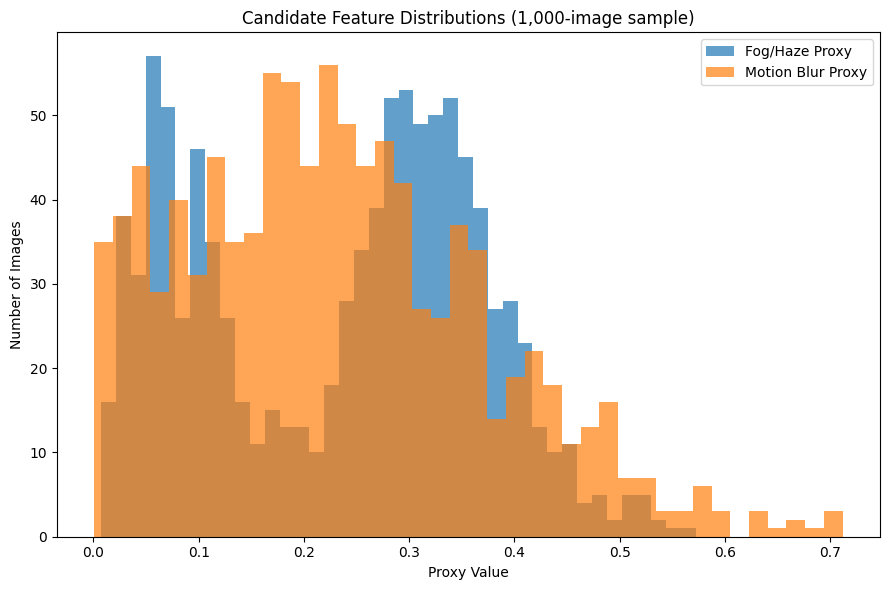

In [57]:
plt.figure(figsize=(9, 6))

plt.hist(
    candidate_sample["fog_haze_proxy"],
    bins=40,
    alpha=0.7,
    label="Fog/Haze Proxy"
)

plt.hist(
    candidate_sample["motion_blur_proxy"],
    bins=40,
    alpha=0.7,
    label="Motion Blur Proxy"
)

plt.xlabel("Proxy Value")
plt.ylabel("Number of Images")
plt.title(
    "Candidate Feature Distributions "
    "(1,000-image sample)"
)

plt.legend()
plt.tight_layout()
plt.show()

Candidate Feature Visual Inspection

VISUAL INSPECTION — fog_haze_proxy


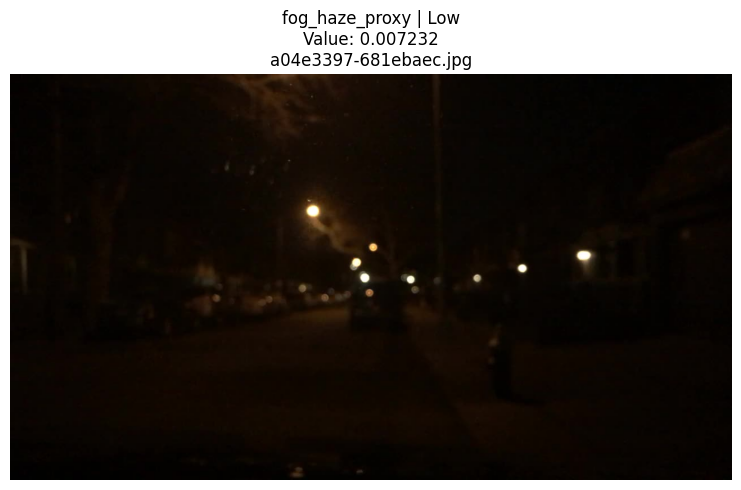

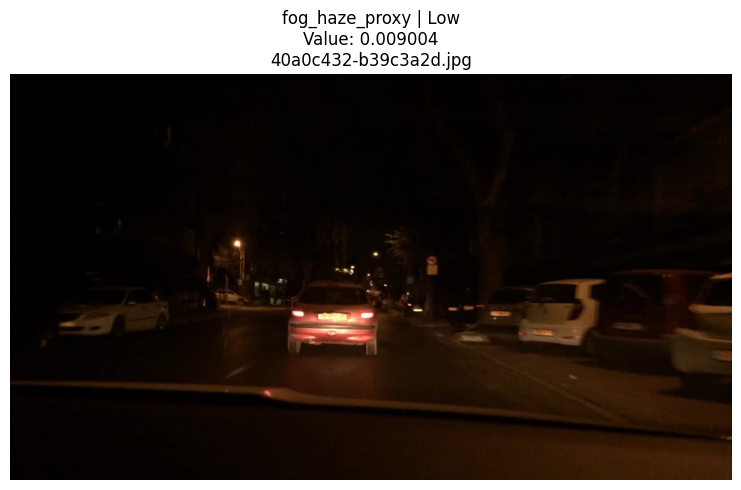

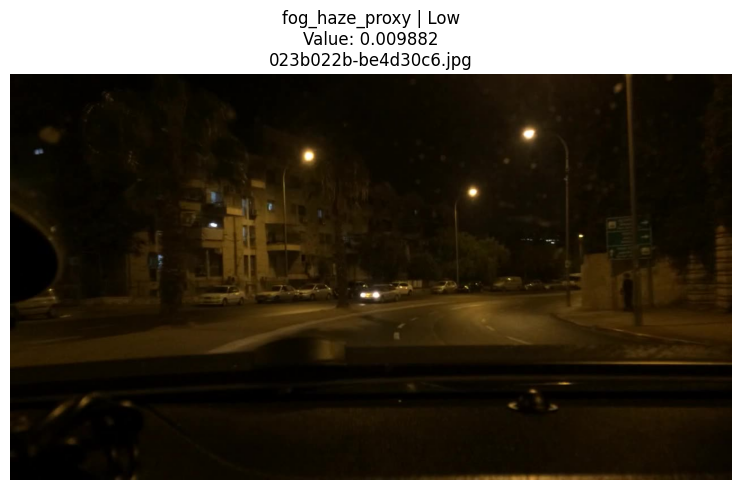

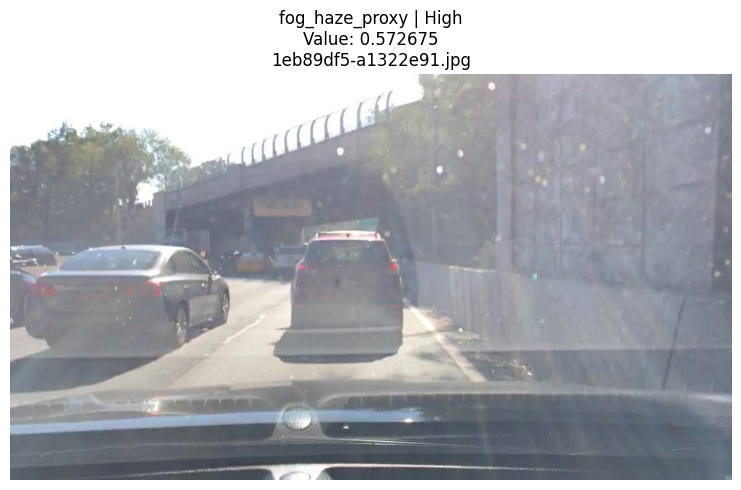

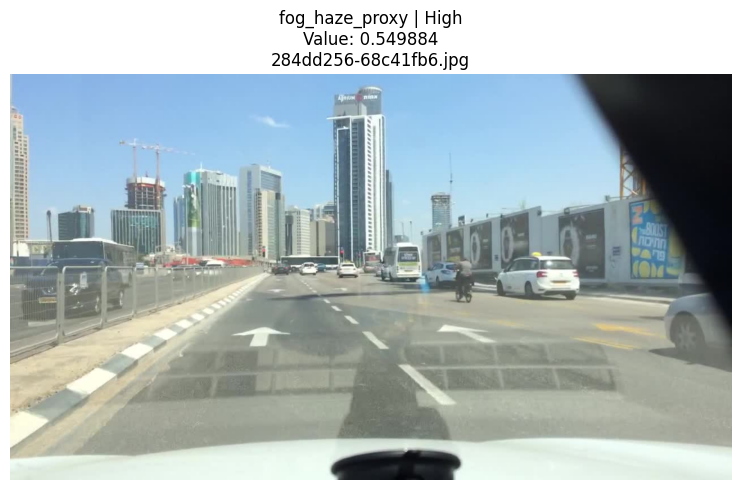

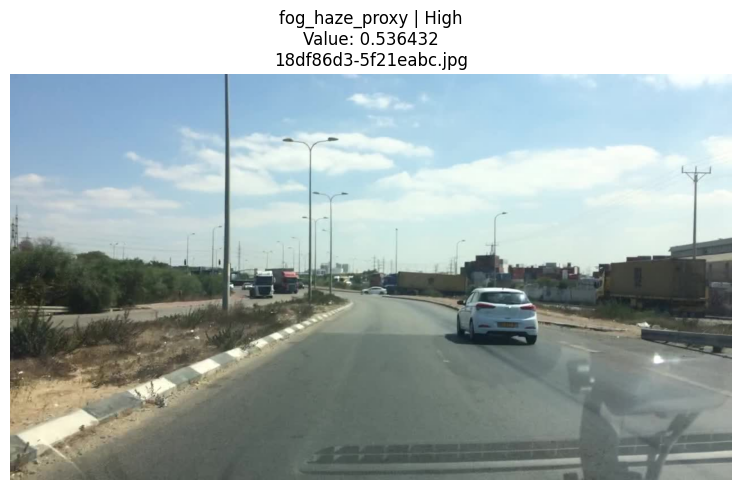

VISUAL INSPECTION — motion_blur_proxy


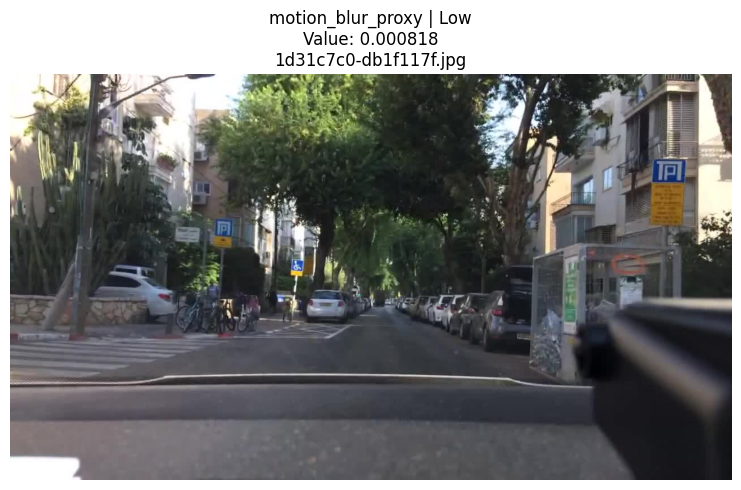

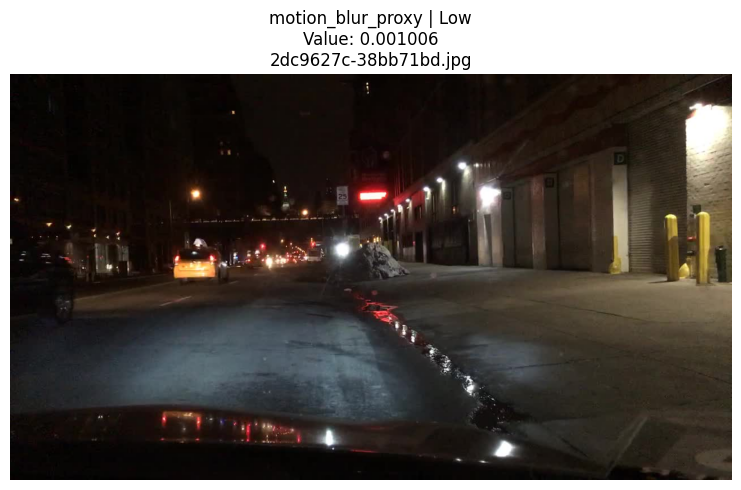

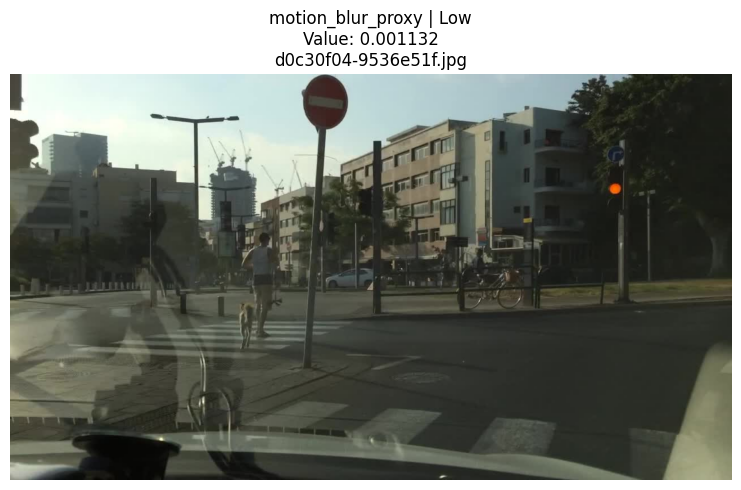

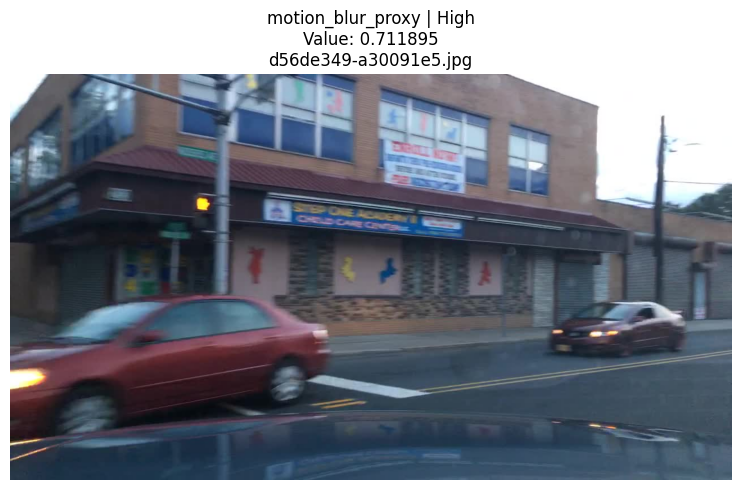

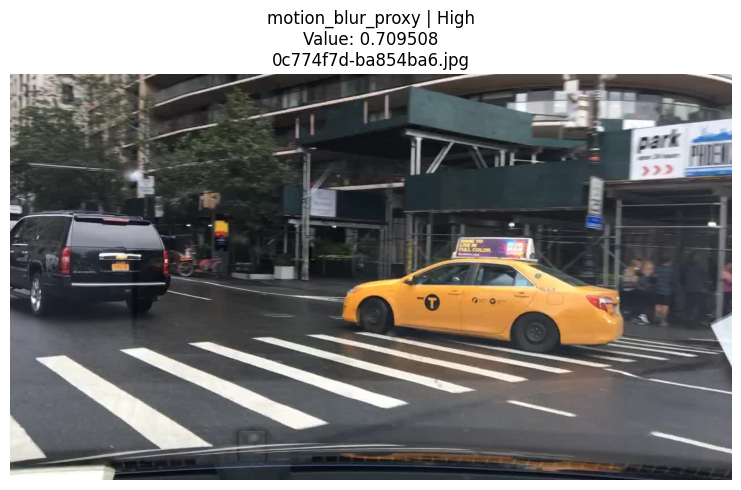

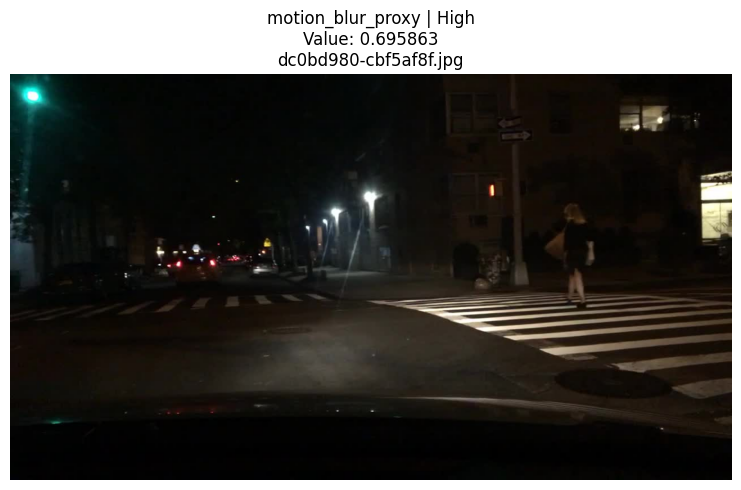

In [58]:


candidate_inspection_features = [
    "fog_haze_proxy",
    "motion_blur_proxy"
]

for feature in candidate_inspection_features:

    print("=" * 75)
    print(
        f"VISUAL INSPECTION — {feature}"
    )
    print("=" * 75)

    lowest = candidate_sample.nsmallest(
        3,
        feature
    )

    highest = candidate_sample.nlargest(
        3,
        feature
    )

    inspection_rows = pd.concat(
        [
            lowest.assign(
                Condition="Low"
            ),
            highest.assign(
                Condition="High"
            )
        ]
    )

    for _, row in inspection_rows.iterrows():

        image_path = Path(
            row["image_path"]
        )

        image = Image.open(
            image_path
        ).convert("RGB")

        plt.figure(figsize=(9, 5))

        plt.imshow(image)
        plt.axis("off")

        plt.title(
            f"{feature} | "
            f"{row['Condition']}\n"
            f"Value: {row[feature]:.6f}\n"
            f"{row['image_name']}"
        )

        plt.tight_layout()
        plt.show()

In [59]:
print("=" * 75)
print("FINAL IQA FEATURE SELECTION")
print("=" * 75)

# ----------------------------------------------------------
# Final retained IQA features
# ----------------------------------------------------------

final_iqa_features = [
    "mean_brightness",
    "rms_contrast",
    "laplacian_variance",
    "tenengrad",
    "entropy",
    "dark_pixel_ratio",
    "bright_pixel_ratio",
    "mean_saturation",
    "saturation_std",
    "colorfulness",
    "edge_density",
    "noise_proxy",
    "motion_blur_proxy"
]

# ----------------------------------------------------------
# Excluded features
# ----------------------------------------------------------

excluded_features = {
    "brightness_std":
        "Exact duplicate of rms_contrast",

    "fog_haze_proxy":
        "Highly redundant with existing brightness/exposure "
        "features and did not show clear haze-specific behavior "
        "during visual inspection"
}

# ----------------------------------------------------------
# Print final decision
# ----------------------------------------------------------

print("\nRETAINED FEATURES")
print("-" * 75)

for i, feature in enumerate(
    final_iqa_features,
    start=1
):
    print(f"{i:2d}. {feature}")

print("\nEXCLUDED FEATURES")
print("-" * 75)

for feature, reason in excluded_features.items():
    print(f"• {feature}")
    print(f"  Reason: {reason}")

print("\n" + "-" * 75)
print(
    f"Original IQA features        : 13"
)
print(
    f"Exact duplicate removed      : 1"
)
print(
    f"New complementary feature    : 1"
)
print(
    f"Final IQA feature count      : "
    f"{len(final_iqa_features)}"
)

# ----------------------------------------------------------
# Save final feature list
# ----------------------------------------------------------

final_feature_list_df = pd.DataFrame({
    "feature": final_iqa_features
})

final_feature_list_path = (
    RESULTS_PATH /
    "iqa_final_feature_list.csv"
)

final_feature_list_df.to_csv(
    final_feature_list_path,
    index=False
)

# ----------------------------------------------------------
# Save feature-selection decisions
# ----------------------------------------------------------

feature_decision_df = pd.DataFrame([
    {
        "feature": "brightness_std",
        "decision": "Excluded",
        "reason":
            "Exact duplicate of rms_contrast"
    },
    {
        "feature": "fog_haze_proxy",
        "decision": "Excluded",
        "reason":
            "Highly redundant with existing brightness/exposure "
            "features and no clear haze-specific visual behavior"
    },
    {
        "feature": "motion_blur_proxy",
        "decision": "Retained",
        "reason":
            "Low redundancy with existing IQA features and "
            "supported by visual inspection"
    }
])

decision_path = (
    RESULTS_PATH /
    "iqa_feature_selection_decisions.csv"
)

feature_decision_df.to_csv(
    decision_path,
    index=False
)

print("\n✓ Final IQA feature list saved:")
print(f"  {final_feature_list_path}")

print("\n✓ Feature-selection decisions saved:")
print(f"  {decision_path}")

print("\n✓ Notebook 4 feature-selection stage finalized.")

FINAL IQA FEATURE SELECTION

RETAINED FEATURES
---------------------------------------------------------------------------
 1. mean_brightness
 2. rms_contrast
 3. laplacian_variance
 4. tenengrad
 5. entropy
 6. dark_pixel_ratio
 7. bright_pixel_ratio
 8. mean_saturation
 9. saturation_std
10. colorfulness
11. edge_density
12. noise_proxy
13. motion_blur_proxy

EXCLUDED FEATURES
---------------------------------------------------------------------------
• brightness_std
  Reason: Exact duplicate of rms_contrast
• fog_haze_proxy
  Reason: Highly redundant with existing brightness/exposure features and did not show clear haze-specific behavior during visual inspection

---------------------------------------------------------------------------
Original IQA features        : 13
Exact duplicate removed      : 1
New complementary feature    : 1
Final IQA feature count      : 13

✓ Final IQA feature list saved:
  E:\ML_Project\results\iqa_final_feature_list.csv

✓ Feature-selection decision

Generate Final IQA Feature Dataset

In [ ]:
print("=" * 75)
print("GENERATING FINAL IQA FEATURE DATASET")
print("=" * 75)

# ----------------------------------------------------------
# Load existing IQA datasets
# ----------------------------------------------------------

train_iqa = pd.read_csv(
    RESULTS_PATH / "iqa_features_train.csv"
)

valid_iqa = pd.read_csv(
    RESULTS_PATH / "iqa_features_valid.csv"
)

test_iqa = pd.read_csv(
    RESULTS_PATH / "iqa_features_test.csv"
)

print(f"Train images : {len(train_iqa):,}")
print(f"Valid images : {len(valid_iqa):,}")
print(f"Test images  : {len(test_iqa):,}")

# ----------------------------------------------------------
# Function to add motion-blur proxy
# ----------------------------------------------------------

def add_motion_blur_feature(df):
    
    values = []

    for index, row in df.iterrows():

        image_path = Path(
            row["image_path"]
        )

        image = Image.open(
            image_path
        ).convert("RGB")

        value = compute_motion_blur_proxy(
            image
        )

        values.append(value)

        if (index + 1) % 5000 == 0:
            print(
                f"  Processed: {index + 1:,} images"
            )

    df = df.copy()

    df["motion_blur_proxy"] = values

    return df


# ----------------------------------------------------------
# Process each official split
# ----------------------------------------------------------

print("\nProcessing TRAIN...")
train_final = add_motion_blur_feature(
    train_iqa
)

print("\nProcessing VALID...")
valid_final = add_motion_blur_feature(
    valid_iqa
)

print("\nProcessing TEST...")
test_final = add_motion_blur_feature(
    test_iqa
)

# ----------------------------------------------------------
# Remove excluded feature
# ----------------------------------------------------------

for df in [
    train_final,
    valid_final,
    test_final
]:

    if "brightness_std" in df.columns:
        df.drop(
            columns=["brightness_std"],
            inplace=True
        )

# ----------------------------------------------------------
# Define final feature order
# ----------------------------------------------------------

final_columns = [
    "image_path",
    "image_name",
    "split",

    "mean_brightness",
    "rms_contrast",
    "laplacian_variance",
    "tenengrad",
    "entropy",
    "dark_pixel_ratio",
    "bright_pixel_ratio",
    "mean_saturation",
    "saturation_std",
    "colorfulness",
    "edge_density",
    "noise_proxy",
    "motion_blur_proxy"
]

# ----------------------------------------------------------
# Keep only final columns
# ----------------------------------------------------------

train_final = train_final[
    final_columns
]

valid_final = valid_final[
    final_columns
]

test_final = test_final[
    final_columns
]

# ----------------------------------------------------------
# Save final datasets
# ----------------------------------------------------------

train_final_path = (
    RESULTS_PATH /
    "iqa_final_features_train.csv"
)

valid_final_path = (
    RESULTS_PATH /
    "iqa_final_features_valid.csv"
)

test_final_path = (
    RESULTS_PATH /
    "iqa_final_features_test.csv"
)

train_final.to_csv(
    train_final_path,
    index=False
)

valid_final.to_csv(
    valid_final_path,
    index=False
)

test_final.to_csv(
    test_final_path,
    index=False
)

# ----------------------------------------------------------
# Combine all splits
# ----------------------------------------------------------

final_iqa_df = pd.concat(
    [
        train_final,
        valid_final,
        test_final
    ],
    ignore_index=True
)

final_all_path = (
    RESULTS_PATH /
    "iqa_final_features_all.csv"
)

final_iqa_df.to_csv(
    final_all_path,
    index=False
)

# ----------------------------------------------------------
# Verification
# ----------------------------------------------------------

print("\n" + "=" * 75)
print("FINAL IQA DATASET VERIFICATION")
print("=" * 75)

print(
    f"Train : {len(train_final):,}"
)

print(
    f"Valid : {len(valid_final):,}"
)

print(
    f"Test  : {len(test_final):,}"
)

print(
    f"Total : {len(final_iqa_df):,}"
)

print(
    f"Features : {len(final_iqa_features)}"
)

print("\nFinal feature columns:")
for i, feature in enumerate(
    final_iqa_features,
    start=1
):
    print(f"{i:2d}. {feature}")

print("\nNaN values:")
print(
    final_iqa_df[
        final_iqa_features
    ].isna().sum().sum()
)

print("\n✓ Final IQA datasets generated successfully.")

GENERATING FINAL IQA FEATURE DATASET
Train images : 70,000
Valid images : 10,000
Test images  : 20,000

Processing TRAIN...
  Processed: 5,000 images
  Processed: 10,000 images
  Processed: 15,000 images
  Processed: 20,000 images
  Processed: 25,000 images
  Processed: 30,000 images
  Processed: 35,000 images
  Processed: 40,000 images
  Processed: 45,000 images
  Processed: 50,000 images
  Processed: 55,000 images
  Processed: 60,000 images
  Processed: 65,000 images
  Processed: 70,000 images

Processing VALID...
  Processed: 5,000 images
  Processed: 10,000 images

Processing TEST...
  Processed: 5,000 images
  Processed: 10,000 images
